# Pneumonia Detection Using Convolutional Neural Network

In [84]:
import tensorflow as tf

print("Available devices:")
print(tf.config.list_physical_devices())

gpus = tf.config.list_physical_devices('GPU')
if gpus:
    print("GPU is available.")
else:
    print("GPU is not available; using CPU instead.")


Available devices:
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
GPU is available.


In [85]:
tf.debugging.set_log_device_placement(True)

## Exploratory Data Analysis

### Data Download & Extraction

In [86]:
import os
import zipfile

In [87]:
!pip install keras

Defaulting to user installation because normal site-packages is not writeable


#### NORMAL

In [88]:
import numpy as np
import pandas as pd
from keras.utils import load_img
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential, load_model
from keras.layers import Dense, Conv2D, Flatten, MaxPooling2D, Dropout
from keras.metrics import Recall, Precision
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.optimizers.schedules import ExponentialDecay
from keras.applications.resnet50 import ResNet50
import keras
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
import glob
from pathlib import Path
from math import sqrt
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.utils import class_weight
from timeit import default_timer as timer

In [89]:
import warnings
warnings.filterwarnings('ignore')

#### Image Size

In [90]:
Image.open('/home/agaonkar/private/chest_xray/train/NORMAL/IM-0115-0001.jpeg').size

(2090, 1858)

In [91]:
Image.open('/home/agaonkar/private/chest_xray/train/PNEUMONIA/person1_bacteria_1.jpeg').size

(712, 439)

#### Image Shape/Number of Channels

In [92]:
img = cv2.imread('/home/agaonkar/private/chest_xray/train/PNEUMONIA/person1_bacteria_1.jpeg')
print(img.shape)

(439, 712, 3)


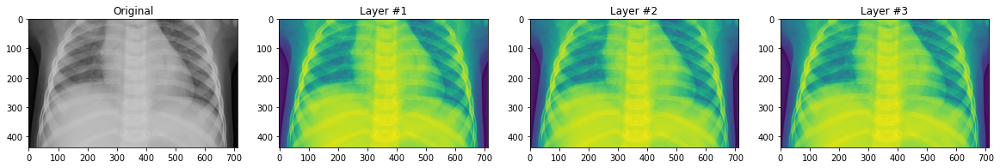

In [93]:
# DISPLAYING ORIGINAL & EACH LAYER SEPARATELY
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(20,5))
axes[0].imshow(img)
axes[0].set_title('Original')

for i in range(1,4):
    ax = axes[i]
    ax.imshow(img[:, :, (i-1)])
    ax.set_title(f'Layer #{i}')

plt.savefig('/home/agaonkar/private/img_breakdown.png', bbox_inches='tight', dpi=300);

At first look, these 3 layers appear to be identical, but we can also reconfirm by comparing the pixel values of the 3 layers:

In [94]:
print((img[:, :, 0] == img[:, :, 1]).all())
print((img[:, :, 0] == img[:, :, 2]).all())

True
True


### DataFrames

In [95]:
# GET THE DIRECTORY TO THE DATASETS
path_data = '/home/agaonkar/private/chest_xray'
path_train = os.path.join(path_data, 'train')
path_test = os.path.join(path_data, 'test')

# INITIATE EMPTY LIST OF TRAINING DATA
# THAT WILL BE CONVERTED TO PANDAS DATAFRAME LATER
data_train = []
data_test = []
data = [data_train, data_test]

# ITERATE THROUGH EACH PATH
for i, d in enumerate([path_train, path_test]):
    # GET THE PATH TO EACH FOLDER - NORMAL AND PNEUMONIA
    normal = os.path.join(d, 'NORMAL')
    pneumonia = os.path.join(d, 'PNEUMONIA')

    # FETCH ALL .jpeg FILES
    normal_imgs = Path(normal).glob('*.jpeg')
    pneumonia_imgs = Path(pneumonia).glob('*.jpeg')

    # APPEND THE NAME AND CORRESPONDING LABEL (BASED ON FOLDER NAME)
    # TO data_train list AS TUPLES
    for img in normal_imgs:
        data[i].append((str(img), 0))

    for img in pneumonia_imgs:
        data[i].append((str(img), 1))

In [96]:
# CONVERT data_train TO DATAFRAME FOR EASY MANIPULATION
columns = ['image', 'label']

train_df = pd.DataFrame(data_train, columns=columns)
test_df = pd.DataFrame(data_test, columns=columns)

In [97]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5216 entries, 0 to 5215
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   5216 non-null   object
 1   label   5216 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 81.6+ KB


In [98]:
train_df.label.value_counts(normalize=True)

label
1    0.742906
0    0.257094
Name: proportion, dtype: float64

In [99]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 624 entries, 0 to 623
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   624 non-null    object
 1   label   624 non-null    int64 
dtypes: int64(1), object(1)
memory usage: 9.9+ KB


In [100]:
test_df.label.value_counts(normalize=True)

label
1    0.625
0    0.375
Name: proportion, dtype: float64

In [101]:
# CONCAT train_df and val_df
master_df = pd.concat([train_df, test_df])
# RESET INDEX (SO THERE WON'T BE ANY DUPLICATED INDICES) BY DROPPING OLD ONES
master_df.reset_index(inplace=True, drop=True)

In [102]:
master_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5840 entries, 0 to 5839
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   5840 non-null   object
 1   label   5840 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 91.4+ KB


In [103]:
# CHECK FOR DUPLICATES
master_df.duplicated().any()

False

In [104]:
# FETCH 10 RANDOM SAMPLES FROM master_df
master_df.sample(10, random_state=42)

,image,label
4582,/home/agaonkar/private/chest_xray/train/PNEUMO...,1
177,/home/agaonkar/private/chest_xray/train/NORMAL...,0
167,/home/agaonkar/private/chest_xray/train/NORMAL...,0
3722,/home/agaonkar/private/chest_xray/train/PNEUMO...,1
2339,/home/agaonkar/private/chest_xray/train/PNEUMO...,1
1047,/home/agaonkar/private/chest_xray/train/NORMAL...,0
4676,/home/agaonkar/private/chest_xray/train/PNEUMO...,1
3955,/home/agaonkar/private/chest_xray/train/PNEUMO...,1
2534,/home/agaonkar/private/chest_xray/train/PNEUMO...,1
1501,/home/agaonkar/private/chest_xray/train/PNEUMO...,1


In [105]:
4265 + 1575

5840

In [106]:
master_df.label.value_counts()

label
1    4265
0    1575
Name: count, dtype: int64

In [107]:
master_df.label.value_counts(normalize=True)

label
1    0.730308
0    0.269692
Name: proportion, dtype: float64

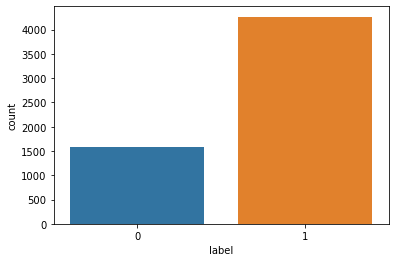

In [108]:
sns.countplot(x='label', data=master_df)
plt.savefig('/home/agaonkar/private/class_ratio.png', bbox_inches='tight', dpi=300);

In [109]:
def cat_pneumonia_type(x):
    if 'BACTERIA' in x:
        output = 'bacteria'
    elif 'VIRUS' in x:
        output = 'virus'
    else:
        output = 'normal'
    return output

In [110]:
master_df['type'] = master_df.image.apply(lambda x: cat_pneumonia_type(x))

In [111]:
master_df.type.value_counts()

type
normal    5840
Name: count, dtype: int64

### Dataset Splitting

In [112]:
# TRAIN TEST SPLIT (TEST SIZE = 15%)
master_train_df, test_df = train_test_split(master_df, test_size=0.15, random_state=42)

In [113]:
# TRAIN VALIDATION SPLIT (VALIDATION SIZE = 20%)
train_df, val_df = train_test_split(master_train_df, test_size=0.2, random_state=42)

In [114]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3971 entries, 234 to 1512
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   3971 non-null   object
 1   label   3971 non-null   int64 
 2   type    3971 non-null   object
dtypes: int64(1), object(2)
memory usage: 124.1+ KB


In [115]:
val_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 993 entries, 5768 to 2661
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   993 non-null    object
 1   label   993 non-null    int64 
 2   type    993 non-null    object
dtypes: int64(1), object(2)
memory usage: 31.0+ KB


In [116]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 876 entries, 4582 to 2850
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   876 non-null    object
 1   label   876 non-null    int64 
 2   type    876 non-null    object
dtypes: int64(1), object(2)
memory usage: 27.4+ KB


### Data Generators

In [117]:
BATCH_SIZE = 32

# CREATE GENERATOR FOR TRAINING DATA (FROM train_df DATAFRAME)
train_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=train_df, x_col='image', y_col='label',
    color_mode='grayscale',   # only keeping 1 channel of the images
    class_mode='raw',
    target_size=(180,180),   # resizing all images to 180 x 180 pixel
    batch_size=BATCH_SIZE,
    seed=42,
    shuffle=True   # shuffle so we're not missing out on any samples
)

# CREATE GENERATOR FOR VALIDATION DATA (FROM val_df DATAFRAME)
val_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=val_df, x_col='image', y_col='label',
    color_mode='grayscale',
    class_mode='raw',
    target_size=(180,180),
    batch_size=BATCH_SIZE,
    seed=42,
    shuffle=True
)

Found 3971 validated image filenames.
Found 993 validated image filenames.


In [118]:
# CHECKING THE SHAPE OF 1 BATCH OF THE train_generator
images_train, labels_train = next(train_generator)
print(f'Training set: {images_train.shape} | {labels_train.shape}')

Training set: (32, 180, 180, 1) | (32,)


### Data Visualization

Next, I am going to display the first 16 images of the first batch with their corresponding labels:

- 0 - NORMAL
- 1 - PNEUMONIA

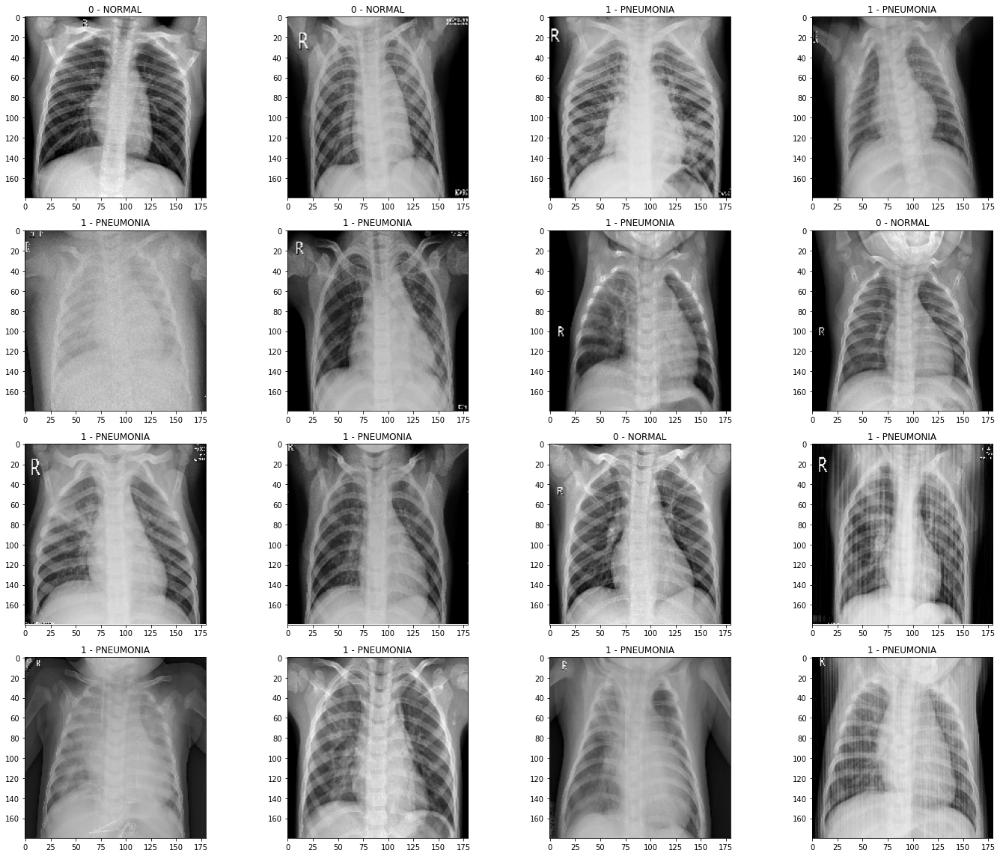

In [119]:
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(20,16))
label_output = {0: 'NORMAL', 1: 'PNEUMONIA'}
i = range(16)

for i in range(16):
    ax = axes[i // 4][i % 4]
    ax.imshow(images_train[i], cmap='gray')
    ax.set_title(f'{labels_train[i]} - {label_output[labels_train[i]]}')

plt.tight_layout()
plt.savefig('/home/agaonkar/private/samples_16.png', bbox_inches='tight', dpi=300);
plt.show();

### Model #1 - CNN from Scratch

Next, I am going to construct another Convolutional Neural Networks (CNN) model with a few more Convolutional & MaxPooling layers to see if they migh help increase model performance further:
- 1 Layer of Convolution 2D with padding
- 1 Layer of MaxPooling 2D
- 1 Layer of Convolution 2D with padding
- 1 Layer of MaxPooling 2D
- 1 Hidden Layer of Dense NN

(This architecture have been selected arbitrarily for the most part, and will be adjusted later depending on the outcome).

In [120]:
cnn_2 = Sequential()
cnn_2.add(Conv2D(32, (3,3), activation='relu', padding='same',
               input_shape=[180,180,1]))
cnn_2.add(Conv2D(64, (3,3), activation='relu', padding='same'))
cnn_2.add(MaxPooling2D(pool_size=(2,2)))
cnn_2.add(Conv2D(128, (3,3), activation='relu', padding='same'))
cnn_2.add(MaxPooling2D(pool_size=(2,2)))
cnn_2.add(Flatten())
cnn_2.add(Dense(32, activation='relu'))
cnn_2.add(Dense(1, activation='sigmoid'))

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomGetKeyCounter in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executin

2024-03-03 01:52:58.501563: I tensorflow/core/common_runtime/placer.cc:114] seed: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:52:58.501613: I tensorflow/core/common_runtime/placer.cc:114] StatelessRandomGetKeyCounter: (StatelessRandomGetKeyCounter): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 01:52:58.501624: I tensorflow/core/common_runtime/placer.cc:114] key_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 01:52:58.501634: I tensorflow/core/common_runtime/placer.cc:114] counter_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 01:52:58.508443: I tensorflow/core/common_runtime/placer.cc:114] shape: (_DeviceArg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:52:58.508475: I tensorflow/core/common_runtime/placer.cc:114] key: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 01:52:58.508485: I tensorflow/core/common_runtime/placer.cc:114] counter: (_Arg): /job:localhost/replic

In [121]:
recall = Recall()
precision = Precision()

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localh

In [122]:
cnn_2.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy', recall, precision])

cnn_2.summary()

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device

2024-03-03 01:52:58.683539: I tensorflow/core/common_runtime/placer.cc:114] resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 01:52:58.683571: I tensorflow/core/common_runtime/placer.cc:114] VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 01:52:58.685238: I tensorflow/core/common_runtime/placer.cc:114] resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 01:52:58.685266: I tensorflow/core/common_runtime/placer.cc:114] value: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 01:52:58.685279: I tensorflow/core/common_runtime/placer.cc:114] AssignVariableOp: (AssignVariableOp): /job:localhost/replica:0/task:0/device:GPU:0


Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 180, 180, 32)      320       
                                                                 
 conv2d_1 (Conv2D)           (None, 180, 180, 64)      18496     
                                                                 
 max_pooling2d (MaxPooling2  (None, 90, 90, 64)        0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 90, 90, 128)       73856     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 45, 45, 128)       0         
 g2D)                                                            
                                                                 
 flatten (Flatten)           (None, 259200)           

In [123]:
checkpoint_cb = ModelCheckpoint('cnn_2.h5',
                                save_best_only=True)
early_stopping_cb = EarlyStopping(patience=10,
                                  restore_best_weights=True)

BATCH_SIZE = 32
EPOCHS = 30

results_2 = cnn_2.fit(train_generator, 
                      validation_data=val_generator,
                      epochs=EPOCHS,
                      steps_per_epoch=(train_generator.n//BATCH_SIZE),
                      validation_steps=(val_generator.n//BATCH_SIZE),
                      callbacks=[checkpoint_cb, early_stopping_cb],
                      use_multiprocessing=True,
                      workers=8)

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in dev

2024-03-03 01:52:59.003224: I tensorflow/core/common_runtime/placer.cc:114] components_0: (_DeviceArg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:52:59.003270: I tensorflow/core/common_runtime/placer.cc:114] TensorDataset: (TensorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:52:59.003282: I tensorflow/core/common_runtime/placer.cc:114] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:52:59.033208: I tensorflow/core/common_runtime/placer.cc:114] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:52:59.033238: I tensorflow/core/common_runtime/placer.cc:114] FlatMapDataset: (FlatMapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:52:59.033250: I tensorflow/core/common_runtime/placer.cc:114] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:52:59.037440: I tensorflow/core/common_runtime/placer.cc:114] input__dataset: (_Arg): /job

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localh

2024-03-03 01:53:00.229228: I tensorflow/core/common_runtime/placer.cc:114] iterator: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:00.229270: I tensorflow/core/common_runtime/placer.cc:114] sequential_3_conv2d_conv2d_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 01:53:00.229281: I tensorflow/core/common_runtime/placer.cc:114] sequential_3_conv2d_biasadd_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 01:53:00.229289: I tensorflow/core/common_runtime/placer.cc:114] sequential_3_conv2d_1_conv2d_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 01:53:00.229298: I tensorflow/core/common_runtime/placer.cc:114] sequential_3_conv2d_1_biasadd_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 01:53:00.229306: I tensorflow/core/common_runtime/placer.cc:114] sequential_3_conv2d_2_conv2d_readvariableop_resource: (

a:0/task:0/device:CPU:0
identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
iterator: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
sequential_3_conv2d_conv2d_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
sequential_3_conv2d_biasadd_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
sequential_3_conv2d_1_conv2d_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
sequential_3_conv2d_1_biasadd_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
seq

2024-03-03 01:53:00.458200: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:00.458255: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:00.458268: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:00.458278: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:00.458288: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:00.458299: I tensorflow/core/common_runtime/placer.cc:114] PyFunc: (PyFunc): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:00.462158: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53

  1/124 [..............................] - ETA: 12:53 - loss: 0.6950 - accuracy: 0.3750 - recall_1: 0.2857 - precision_1: 0.5455Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1697 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 6s - loss: 2.1423 - accuracy: 0.5000 - recall_1: 0.6341 - precision_1: 0.6047   Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1697 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1697 in device /job:loca

2024-03-03 01:53:11.421118: I tensorflow/core/common_runtime/placer.cc:114] resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 01:53:11.421182: I tensorflow/core/common_runtime/placer.cc:114] ReadVariableOp: (ReadVariableOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 01:53:11.421194: I tensorflow/core/common_runtime/placer.cc:114] value_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 01:53:11.424643: I tensorflow/core/common_runtime/placer.cc:114] x: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 01:53:11.424670: I tensorflow/core/common_runtime/placer.cc:114] y: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 01:53:11.424683: I tensorflow/core/common_runtime/placer.cc:114] DivNoNan: (DivNoNan): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 01:53:11.424692: I tensorflow/core/common_runtime/placer.cc:114] z_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 

Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DivNoNan in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:loca

2024-03-03 01:53:12.099791: I tensorflow/core/common_runtime/placer.cc:114] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:12.099845: I tensorflow/core/common_runtime/placer.cc:114] FlatMapDataset: (FlatMapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:12.099857: I tensorflow/core/common_runtime/placer.cc:114] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:12.137478: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:12.137521: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:12.137533: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:12.137543: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0

: (Identity): /job:localhost/replica:0/task:0/device:GPU:0
output_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
ReadVariableOp: (ReadVariableOp): /job:localhost/replica:0/task:0/device:GPU:0
value_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
input: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
begin: (_DeviceArg): /job:localhost/replica:0/task:0/device:CPU:0
end: (_DeviceArg): /job:localhost/replica:0/task:0/device:CPU:0
strides: (_DeviceArg): /job:localhost/replica:0/task:0/device:CPU:0
StridedSlice: (StridedSlice): /job:localhost/replica:0/task:0/device:GPU:0
output_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
FlatMapDataset: (FlatMapDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/repl

2024-03-03 01:53:12.726449: I tensorflow/core/common_runtime/placer.cc:114] iterator: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:12.726494: I tensorflow/core/common_runtime/placer.cc:114] sequential_3_conv2d_conv2d_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 01:53:12.726505: I tensorflow/core/common_runtime/placer.cc:114] sequential_3_conv2d_biasadd_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 01:53:12.726514: I tensorflow/core/common_runtime/placer.cc:114] sequential_3_conv2d_1_conv2d_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 01:53:12.726522: I tensorflow/core/common_runtime/placer.cc:114] sequential_3_conv2d_1_biasadd_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 01:53:12.726530: I tensorflow/core/common_runtime/placer.cc:114] sequential_3_conv2d_2_conv2d_readvariableop_resource: (

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:loca

2024-03-03 01:53:19.356718: I tensorflow/core/common_runtime/placer.cc:114] resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 01:53:19.356762: I tensorflow/core/common_runtime/placer.cc:114] ReadVariableOp: (ReadVariableOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 01:53:19.356773: I tensorflow/core/common_runtime/placer.cc:114] value_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 01:53:19.359691: I tensorflow/core/common_runtime/placer.cc:114] resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 01:53:19.359720: I tensorflow/core/common_runtime/placer.cc:114] ReadVariableOp: (ReadVariableOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 01:53:19.359731: I tensorflow/core/common_runtime/placer.cc:114] value_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 01:53:19.364389: I tensorflow/core/common_runtime/placer.cc:114] resource: (_Arg): /job:localhost/replica:0/t

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

2024-03-03 01:53:19.875686: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:19.875734: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:19.875746: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:19.875756: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:19.875764: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:19.875773: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:19.907034: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 1:14 - loss: 0.0886 - accuracy: 1.0000 - recall_1: 1.0000 - precision_1: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1697 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 8s - loss: 0.1340 - accuracy: 0.9531 - recall_1: 0.9400 - precision_1: 1.0000  Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1697 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 7s - loss: 0.1188 - accuracy: 0.9583 - recall_1: 0.9459 - precision_1: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Ident

2024-03-03 01:53:26.816173: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:26.816228: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:26.816243: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:26.816254: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:26.816263: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:26.816271: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:26.830723: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:loca

2024-03-03 01:53:33.866069: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:33.866134: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:33.866147: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:33.866156: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:33.866165: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:33.866174: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:33.897969: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 1:27 - loss: 0.1972 - accuracy: 0.9375 - recall_1: 1.0000 - precision_1: 0.9048Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1697 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 6s - loss: 0.1479 - accuracy: 0.9531 - recall_1: 1.0000 - precision_1: 0.9302  Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1697 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1697 in device /job:localh

2024-03-03 01:53:40.889724: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:40.889782: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:40.889797: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:40.889808: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:40.889818: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:40.889827: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:40.904501: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:loca

2024-03-03 01:53:47.521778: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:47.521834: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:47.521855: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:47.521865: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:47.521874: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:47.521883: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:47.562591: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 1:19 - loss: 0.0369 - accuracy: 1.0000 - recall_1: 1.0000 - precision_1: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1697 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 6s - loss: 0.0999 - accuracy: 0.9531 - recall_1: 0.9318 - precision_1: 1.0000  Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1697 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1697 in device /job:localh

2024-03-03 01:53:54.531601: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:54.531655: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:54.531668: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:54.531677: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:54.531689: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:54.531699: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:53:54.546585: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:loca

2024-03-03 01:54:01.597542: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:01.597598: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:01.597610: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:01.597620: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:01.597639: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:01.597649: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:01.628072: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 1:14 - loss: 0.0426 - accuracy: 1.0000 - recall_1: 1.0000 - precision_1: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1697 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 12s - loss: 0.0558 - accuracy: 1.0000 - recall_1: 1.0000 - precision_1: 1.0000 Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1697 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 9s - loss: 0.0672 - accuracy: 0.9792 - recall_1: 0.9726 - precision_1: 1.0000 Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Iden

2024-03-03 01:54:08.649241: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:08.649311: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:08.649349: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:08.649367: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:08.649384: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:08.649399: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:08.664538: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:loca

2024-03-03 01:54:15.275108: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:15.275163: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:15.275175: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:15.275185: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:15.275193: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:15.275211: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:15.306427: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 1:29 - loss: 0.0116 - accuracy: 1.0000 - recall_1: 1.0000 - precision_1: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1697 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 6s - loss: 0.0297 - accuracy: 1.0000 - recall_1: 1.0000 - precision_1: 1.0000  Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1697 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 6s - loss: 0.0386 - accuracy: 0.9896 - recall_1: 1.0000 - precision_1: 0.9857Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Ident

2024-03-03 01:54:22.392303: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:22.392371: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:22.392391: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:22.392402: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:22.392413: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:22.392422: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:22.407102: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:loca

2024-03-03 01:54:29.071771: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:29.071826: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:29.071838: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:29.071847: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:29.071857: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:29.071865: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:29.106527: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 1:34 - loss: 0.0507 - accuracy: 1.0000 - recall_1: 1.0000 - precision_1: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1697 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 6s - loss: 0.0430 - accuracy: 0.9844 - recall_1: 1.0000 - precision_1: 0.9800  Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1697 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1697 in device /job:localh

2024-03-03 01:54:36.237836: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:36.237900: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:36.237919: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:36.237931: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:36.237941: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:36.237951: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:36.252291: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:loca

2024-03-03 01:54:42.995530: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:42.995582: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:42.995594: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:42.995604: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:42.995613: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:42.995621: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:43.025803: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 1:36 - loss: 0.0181 - accuracy: 1.0000 - recall_1: 1.0000 - precision_1: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1697 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 6s - loss: 0.0277 - accuracy: 0.9844 - recall_1: 1.0000 - precision_1: 0.9796  Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1697 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1697 in device /job:localh

2024-03-03 01:54:50.216035: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:50.216129: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:50.216169: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:50.216192: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:50.216209: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:50.216226: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:50.236209: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:loca

2024-03-03 01:54:52.761448: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:52.761506: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:52.761520: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:52.761531: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:52.761542: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:52.761551: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:54:52.794827: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 1:41 - loss: 0.0019 - accuracy: 1.0000 - recall_1: 1.0000 - precision_1: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1697 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 6s - loss: 0.0024 - accuracy: 1.0000 - recall_1: 1.0000 - precision_1: 1.0000  Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1697 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 6s - loss: 0.0085 - accuracy: 1.0000 - recall_1: 1.0000 - precision_1: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Ident

2024-03-03 01:55:00.045296: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:00.045360: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:00.045373: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:00.045383: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:00.045397: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:00.045408: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:00.060807: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:loca

2024-03-03 01:55:06.809148: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:06.809201: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:06.809213: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:06.809223: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:06.809232: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:06.809240: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:06.841293: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 1:35 - loss: 0.0360 - accuracy: 1.0000 - recall_1: 1.0000 - precision_1: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1697 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 6s - loss: 0.0275 - accuracy: 1.0000 - recall_1: 1.0000 - precision_1: 1.0000  Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1697 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1697 in device /job:localh

2024-03-03 01:55:14.053401: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:14.053454: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:14.053467: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:14.053477: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:14.053490: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:14.053500: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:14.068107: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:loca

2024-03-03 01:55:20.748145: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:20.748197: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:20.748210: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:20.748219: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:20.748228: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:20.748237: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:20.779426: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 1:41 - loss: 0.0021 - accuracy: 1.0000 - recall_1: 1.0000 - precision_1: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1697 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 6s - loss: 0.0022 - accuracy: 1.0000 - recall_1: 1.0000 - precision_1: 1.0000  Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1697 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1697 in device /job:localh

2024-03-03 01:55:28.075520: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:28.075584: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:28.075599: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:28.075610: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:28.075619: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:28.075628: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:28.091942: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:loca

2024-03-03 01:55:34.870841: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:34.870893: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:34.870905: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:34.870915: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:34.870927: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:34.870936: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:34.902628: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 1:41 - loss: 2.1270e-04 - accuracy: 1.0000 - recall_1: 1.0000 - precision_1: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1697 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 6s - loss: 6.4882e-04 - accuracy: 1.0000 - recall_1: 1.0000 - precision_1: 1.0000  Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1697 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1697 in device /jo

2024-03-03 01:55:42.203816: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:42.203877: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:42.203892: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:42.203904: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:42.203914: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:42.203923: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:42.219006: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:loca

2024-03-03 01:55:44.783148: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:44.783206: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:44.783219: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:44.783228: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:44.783242: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:44.783252: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:44.821368: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 1:38 - loss: 0.0100 - accuracy: 1.0000 - recall_1: 1.0000 - precision_1: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1697 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 6s - loss: 0.0052 - accuracy: 1.0000 - recall_1: 1.0000 - precision_1: 1.0000  Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1697 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1697 in device /job:localh

2024-03-03 01:55:52.061288: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:52.061355: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:52.061372: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:52.061383: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:52.061395: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:52.061405: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:52.076479: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:loca

2024-03-03 01:55:58.856198: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:58.856254: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:58.856266: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:58.856275: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:58.856284: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:58.856293: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:55:58.886658: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 1:42 - loss: 0.0452 - accuracy: 0.9688 - recall_1: 1.0000 - precision_1: 0.9583Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1697 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 6s - loss: 0.0228 - accuracy: 0.9844 - recall_1: 1.0000 - precision_1: 0.9800  Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_1697 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 6s - loss: 0.0156 - accuracy: 0.9896 - recall_1: 1.0000 - precision_1: 0.9859Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Ident

2024-03-03 01:56:06.169190: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:56:06.169266: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:56:06.169294: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:56:06.169317: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:56:06.169347: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:56:06.169364: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:56:06.187168: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:loca

2024-03-03 01:56:12.982742: I tensorflow/core/common_runtime/placer.cc:114] resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 01:56:12.982786: I tensorflow/core/common_runtime/placer.cc:114] value: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 01:56:12.982800: I tensorflow/core/common_runtime/placer.cc:114] AssignVariableOp: (AssignVariableOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 01:56:12.986297: I tensorflow/core/common_runtime/placer.cc:114] resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 01:56:12.986324: I tensorflow/core/common_runtime/placer.cc:114] value: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 01:56:12.986356: I tensorflow/core/common_runtime/placer.cc:114] AssignVariableOp: (AssignVariableOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 01:56:12.990192: I tensorflow/core/common_runtime/placer.cc:114] resource: (_Arg): /job:localhost/replica:0/task:0/device

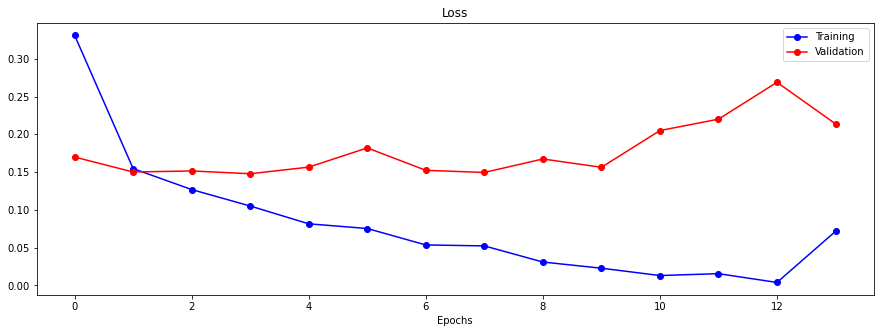

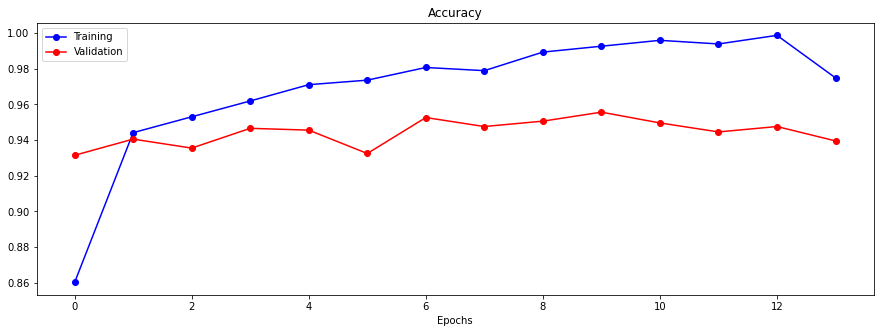

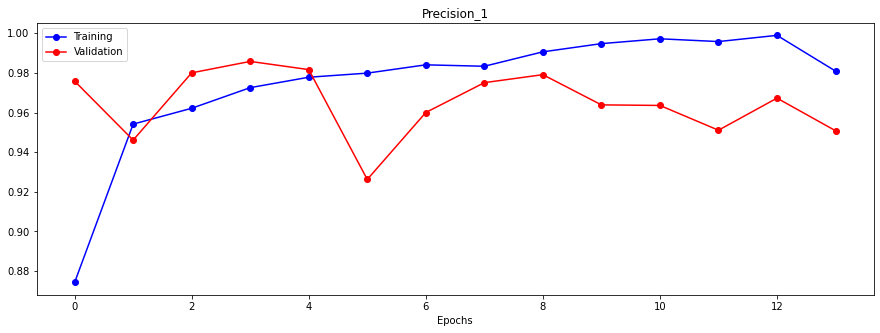

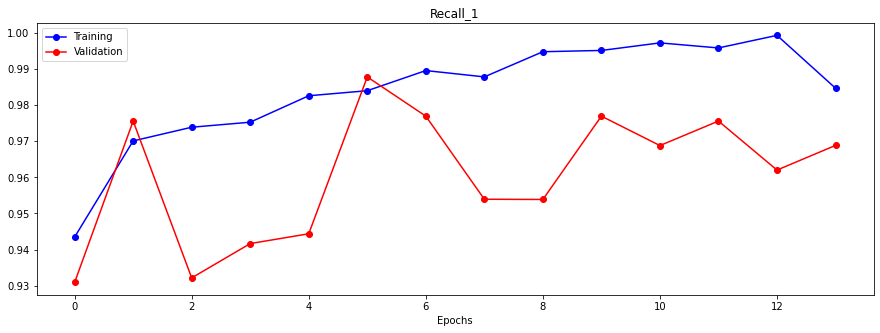

In [124]:
# VISUALIZE MODEL PERFORMANCE
def visualize_training_results(results):
    history = results.history
    
    for m in ['loss', 'accuracy', 'precision_1', 'recall_1']:
        plt.figure(figsize=(15,5))
        plt.plot(history[m], label='Training', marker='o', color='blue')
        plt.plot(history[f'val_{m}'], label='Validation', marker='o', color='red')
        plt.xlabel('Epochs')
        plt.legend()
        plt.title(m.title())
    
    plt.show();
visualize_training_results(results_2)

In [125]:
# MAKE PREDICTIONS USING THE EVALUATION GENERATORS
preds_train_2 = cnn_2.predict(train_generator, 
                                steps=(train_generator.n//BATCH_SIZE+1), 
                                verbose=1,
                                workers=8)
preds_val_2 = cnn_2.predict(val_generator, 
                              steps=(val_generator.n//BATCH_SIZE+1),
                              verbose=1,
                              workers=8)

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableO

2024-03-03 01:56:14.089999: I tensorflow/core/common_runtime/placer.cc:114] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:56:14.090052: I tensorflow/core/common_runtime/placer.cc:114] FlatMapDataset: (FlatMapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:56:14.090064: I tensorflow/core/common_runtime/placer.cc:114] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:56:14.116813: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:56:14.116845: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:56:14.116856: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:56:14.116865: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0

  1/125 [..............................] - ETA: 1:03Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_16473 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_16473 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_16473 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0

2024-03-03 01:56:19.067593: I tensorflow/core/common_runtime/placer.cc:114] input: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 01:56:19.067644: I tensorflow/core/common_runtime/placer.cc:114] Shape: (Shape): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 01:56:19.067655: I tensorflow/core/common_runtime/placer.cc:114] output_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 01:56:19.071778: I tensorflow/core/common_runtime/placer.cc:114] input: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:56:19.071806: I tensorflow/core/common_runtime/placer.cc:114] begin: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:56:19.071816: I tensorflow/core/common_runtime/placer.cc:114] end: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:56:19.071825: I tensorflow/core/common_runtime/placer.cc:114] strides: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:56:19.071842: I tensor

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/

2024-03-03 01:56:19.600337: I tensorflow/core/common_runtime/placer.cc:114] values_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:56:19.600391: I tensorflow/core/common_runtime/placer.cc:114] values_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:56:19.600401: I tensorflow/core/common_runtime/placer.cc:114] values_2: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:56:19.600410: I tensorflow/core/common_runtime/placer.cc:114] values_3: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:56:19.600418: I tensorflow/core/common_runtime/placer.cc:114] values_4: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:56:19.600427: I tensorflow/core/common_runtime/placer.cc:114] values_5: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:56:19.600435: I tensorflow/core/common_runtime/placer.cc:114] values_6: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:56:19.600443:

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableO

2024-03-03 01:56:24.249825: I tensorflow/core/common_runtime/placer.cc:114] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:56:24.249874: I tensorflow/core/common_runtime/placer.cc:114] FlatMapDataset: (FlatMapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:56:24.249885: I tensorflow/core/common_runtime/placer.cc:114] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:56:24.275104: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:56:24.275137: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:56:24.275149: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:56:24.275159: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0

 1/32 [..............................] - ETA: 10sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_16473 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_16473 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_16473 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Ex

2024-03-03 01:56:26.007250: I tensorflow/core/common_runtime/placer.cc:114] values_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:56:26.007296: I tensorflow/core/common_runtime/placer.cc:114] values_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:56:26.007306: I tensorflow/core/common_runtime/placer.cc:114] values_2: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:56:26.007315: I tensorflow/core/common_runtime/placer.cc:114] values_3: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:56:26.007324: I tensorflow/core/common_runtime/placer.cc:114] values_4: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:56:26.007342: I tensorflow/core/common_runtime/placer.cc:114] values_5: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:56:26.007351: I tensorflow/core/common_runtime/placer.cc:114] values_6: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 01:56:26.007360:

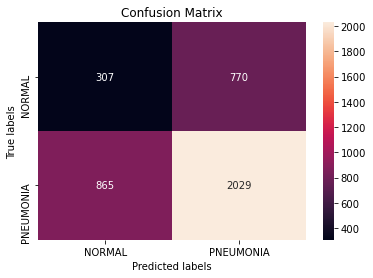

In [127]:
# PLOT CONFUSION MATRIX FOR TRAINING SET
# (converting predicted values from float to nearest integer)
def plot_confusionmatrix(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    
    ax= plt.subplot()
    # annot=True to annotate cells, ftm='g' to disable scientific notation
    sns.heatmap(cm, annot=True, fmt='g', ax=ax)

    # labels, title and ticks
    ax.set_xlabel('Predicted labels')
    ax.set_ylabel('True labels')
    ax.set_title('Confusion Matrix')
    ax.xaxis.set_ticklabels(['NORMAL', 'PNEUMONIA'])
    ax.yaxis.set_ticklabels(['NORMAL', 'PNEUMONIA'])
    plt.show();
plot_confusionmatrix(train_df['label'], np.rint(preds_train_2))  

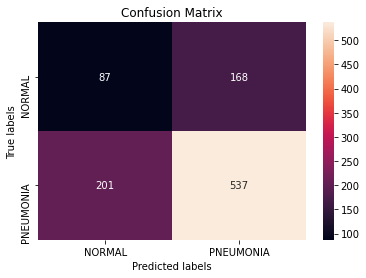

In [128]:
# PLOT CONFUSION MATRIX FOR VALIDATION SET
plot_confusionmatrix(val_df['label'], np.rint(preds_val_2))

In [129]:
cnn_2_metrics = cnn_2.evaluate(val_eval_generator)

NameError: name 'val_eval_generator' is not defined

In [130]:
def plot_confusionmatrix(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    
    ax= plt.subplot()
    # annot=True to annotate cells, ftm='g' to disable scientific notation
    sns.heatmap(cm, annot=True, fmt='g', ax=ax)

    # labels, title and ticks
    ax.set_xlabel('Predicted labels')
    ax.set_ylabel('True labels')
    ax.set_title('Confusion Matrix')
    ax.xaxis.set_ticklabels(['NORMAL', 'PNEUMONIA'])
    ax.yaxis.set_ticklabels(['NORMAL', 'PNEUMONIA'])
    plt.show();

In [131]:
# SAVE THE MODEL
cnn_2.save("cnn_2.h5")

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

In [132]:
BATCH_SIZE = 32

test_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=test_df, x_col='image', y_col='label',
    class_mode='raw',
    color_mode='grayscale',
    target_size=(180,180), batch_size=BATCH_SIZE,
    seed=2021,
    shuffle=False
)

Found 876 validated image filenames.


In [133]:
preds_test_2 = cnn_2.predict(test_generator,
                            steps=(test_generator.n//BATCH_SIZE+1),
                            verbose=1,
                            workers=8)

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableO

2024-03-03 02:06:57.683895: I tensorflow/core/common_runtime/placer.cc:114] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:06:57.683946: I tensorflow/core/common_runtime/placer.cc:114] FlatMapDataset: (FlatMapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:06:57.683959: I tensorflow/core/common_runtime/placer.cc:114] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:06:57.709557: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:06:57.709606: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:06:57.709619: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:06:57.709630: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0

 1/28 [>.............................] - ETA: 9sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_16473 in device /job:localhost/replica:0/task:0/device:GPU:0
 2/28 [=>............................] - ETA: 1sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_16473 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_16473 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device 

2024-03-03 02:06:59.559053: I tensorflow/core/common_runtime/placer.cc:114] values_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:06:59.559096: I tensorflow/core/common_runtime/placer.cc:114] values_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:06:59.559108: I tensorflow/core/common_runtime/placer.cc:114] values_2: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:06:59.559118: I tensorflow/core/common_runtime/placer.cc:114] values_3: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:06:59.559127: I tensorflow/core/common_runtime/placer.cc:114] values_4: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:06:59.559136: I tensorflow/core/common_runtime/placer.cc:114] values_5: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:06:59.559145: I tensorflow/core/common_runtime/placer.cc:114] values_6: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:06:59.559155:

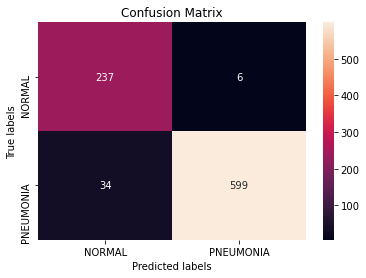

In [134]:
plot_confusionmatrix(test_df['label'], np.rint(preds_test_2)) 

In [135]:
cnn_2.evaluate(test_generator)

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identi

2024-03-03 02:07:02.780867: I tensorflow/core/common_runtime/placer.cc:114] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:07:02.780915: I tensorflow/core/common_runtime/placer.cc:114] FlatMapDataset: (FlatMapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:07:02.780927: I tensorflow/core/common_runtime/placer.cc:114] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:07:02.807971: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:07:02.808009: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:07:02.808022: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:07:02.808032: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0

 1/28 [>.............................] - ETA: 8s - loss: 0.0517 - accuracy: 1.0000 - recall_1: 1.0000 - precision_1: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
 2/28 [=>............................] - ETA: 5s - loss: 0.1720 - accuracy: 0.9375 - recall_1: 0.9149 - precision_1: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
 3/28 [==>...........................] - ETA: 5s - loss: 0.1398 - accuracy: 0.9479 - recall_1: 0.9315 - precision_1: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in devic

[0.1255142241716385,
 0.9543378949165344,
 0.9462875127792358,
 0.9900826215744019]

In [136]:
# CALCULATE cnn_4's PERFORMANCE METRICS ON VALIDATION SET
cnn_2_metrics = cnn_2.evaluate(test_generator)
# CREATE A DATAFRAME TO KEEP TRACK OF ALL MODELS PERFOMANCE ON VALIDATION SET
perf_df = pd.DataFrame(columns=['model', 'loss', 'accuracy', 'recall', 'precision'])
perf_df.loc[len(perf_df.index)] = ['CNN'] + cnn_2_metrics
perf_df

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identi

2024-03-03 02:07:09.499218: I tensorflow/core/common_runtime/placer.cc:114] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:07:09.499267: I tensorflow/core/common_runtime/placer.cc:114] FlatMapDataset: (FlatMapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:07:09.499280: I tensorflow/core/common_runtime/placer.cc:114] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:07:09.527104: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:07:09.527147: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:07:09.527158: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:07:09.527168: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0

 1/28 [>.............................] - ETA: 8s - loss: 0.0517 - accuracy: 1.0000 - recall_1: 1.0000 - precision_1: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
 2/28 [=>............................] - ETA: 5s - loss: 0.1720 - accuracy: 0.9375 - recall_1: 0.9149 - precision_1: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_2752 in device /job:localhost/replica:0/task:0/device:GPU:0
 3/28 [==>...........................] - ETA: 5s - loss: 0.1398 - accuracy: 0.9479 - recall_1: 0.9315 - precision_1: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in devic

,model,loss,accuracy,recall,precision
0,CNN,0.125514,0.954338,0.946288,0.990083


In [137]:


# Compute confusion matrix
cm = confusion_matrix(test_df['label'], np.rint(preds_test_2))
TP = cm[1, 1]
TN = cm[0, 0]
FP = cm[0, 1]
FN = cm[1, 0]

# Calculate metrics
accuracy = (TP + TN) / (TP + TN + FP + FN)
precision = TP / (TP + FP)
recall = TP / (TP + FN)
f1_score = TP / (TP + 0.5 * (FP + FN))

# Matthews correlation coefficient (MCC)
mcc_numerator = TN * TP - FN * FP
mcc_denominator = sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN))
mcc_score = mcc_numerator / mcc_denominator if mcc_denominator != 0 else 0

# Cohen's Kappa score
kappa_numerator = 2 * (TP * TN - FN * FP)
kappa_denominator = (TP + FP) * (FP + TN) + (TP + FN) * (FN + TN)
kappa_score = kappa_numerator / kappa_denominator if kappa_denominator != 0 else 0

# Print metrics
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1_score:.4f}")
print(f"MCC Score: {mcc_score:.4f}")
print(f"Kappa Score: {kappa_score:.4f}")


Accuracy: 0.9543
Precision: 0.9901
Recall: 0.9463
F1 Score: 0.9677
MCC Score: 0.8927
Kappa Score: 0.8900


## Model 2 : CNN with Correcting Class Imbalances & Data Augmentation

#### Class Weights

In [138]:
class_weights = class_weight.compute_class_weight('balanced',
                                                  classes=train_df['label'].unique(),
                                                  y=train_df['label'])

In [139]:
print(train_df['label'].unique())
print(class_weights)

[0 1]
[1.84354689 0.68607464]


In [140]:
class_weight = {0: class_weights[0], 1: class_weights[1]}
class_weight

{0: 1.8435468895078924, 1: 0.6860746371803732}

### Image Data Augmentation



In [141]:
# CREATE AN AUGMENTATION GENERATOR FOR TRAINING DATASET
aug = ImageDataGenerator(rescale=1.0/255,
                         horizontal_flip=True,
                         rotation_range=10)

In [142]:
# # CREATE NEW GENERATOR FOR TRAINING DATA (FROM train_df DATAFRAME)
aug_train_generator = aug.flow_from_dataframe(
    dataframe=train_df, x_col='image', y_col='label',
    color_mode='grayscale',
    class_mode='raw',
    target_size=(180,180),
    batch_size=BATCH_SIZE,
    seed=42,
    shuffle=True   # shuffle so we're not missing out on any samples

)

Found 3971 validated image filenames.


In [143]:
images_train, labels_train = next(aug_train_generator)

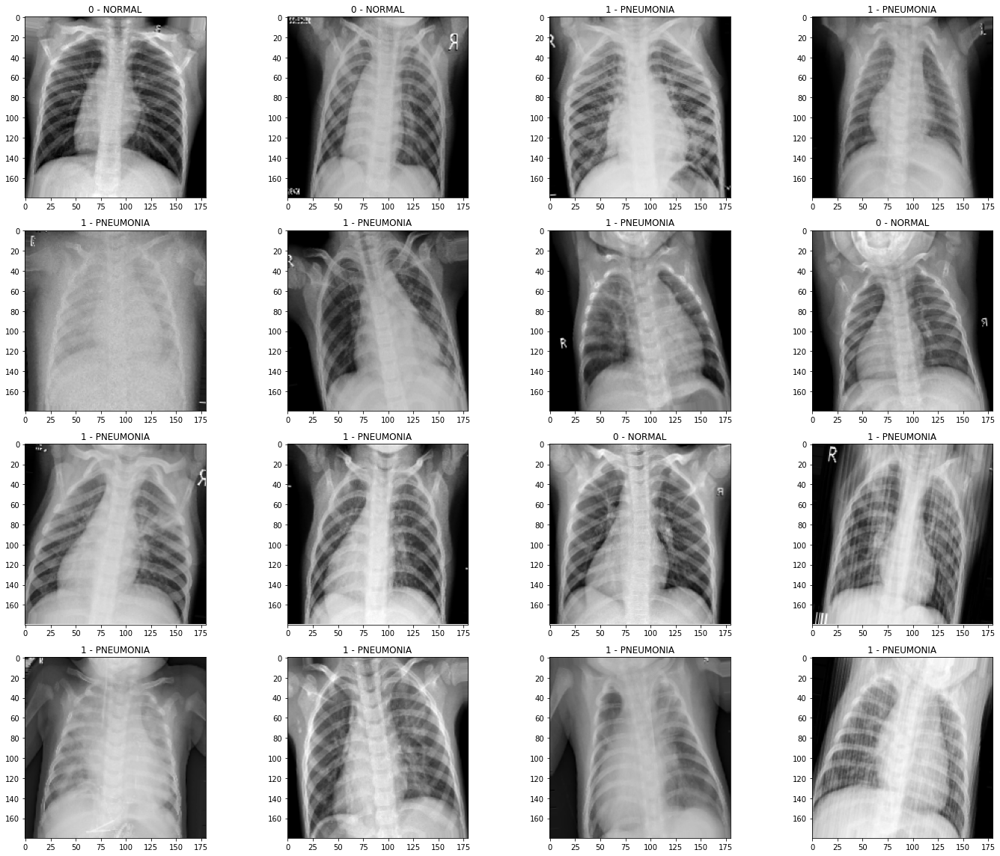

In [144]:
# AUGMENTED DATA VISUALIZAITON
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(20,16))
label_output = {0: 'NORMAL', 1: 'PNEUMONIA'}
i = range(16)

for i in range(16):
    ax = axes[i // 4][i % 4]
    ax.imshow(images_train[i], cmap='gray')
    ax.set_title(f'{labels_train[i]} - {label_output[labels_train[i]]}')

plt.tight_layout()
plt.show()

In [145]:
# CONSTRUCT MODEL LAYERS
cnn_3 = Sequential()
cnn_3.add(Conv2D(32, (3,3), activation='relu', padding='same',
               input_shape=[180,180,1]))
cnn_3.add(MaxPooling2D(pool_size=(2,2)))
cnn_3.add(Conv2D(32, (3,3), activation='relu', padding='same'))
cnn_3.add(MaxPooling2D(pool_size=(2,2)))
cnn_3.add(Flatten())
cnn_3.add(Dense(128, activation='relu'))
cnn_3.add(Dense(64, activation='relu'))
cnn_3.add(Dense(1, activation='sigmoid'))

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomGetKeyCounter in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomUniformV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing o

2024-03-03 02:07:34.280554: I tensorflow/core/common_runtime/placer.cc:114] resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 02:07:34.280600: I tensorflow/core/common_runtime/placer.cc:114] VarHandleOp: (VarHandleOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 02:07:34.282594: I tensorflow/core/common_runtime/placer.cc:114] resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 02:07:34.282621: I tensorflow/core/common_runtime/placer.cc:114] value: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 02:07:34.282634: I tensorflow/core/common_runtime/placer.cc:114] AssignVariableOp: (AssignVariableOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 02:07:34.312535: I tensorflow/core/common_runtime/placer.cc:114] resource_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 02:07:34.312564: I tensorflow/core/common_runtime/placer.cc:114] VarHandleOp: (VarHandleOp): /job:localhost/

In [146]:
recall = Recall()
precision = Precision()

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localh

In [162]:
# COMPILE MODEL
cnn_3.compile(loss='binary_crossentropy',
                 optimizer='adam',
                 metrics=['accuracy', recall, precision])

# PRINT OUT MODEL SUMMARY
cnn_3.summary()

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device

In [163]:
class TimingCallback(keras.callbacks.Callback):
    def __init__(self, logs={}):
        self.logs=[]
    def on_epoch_begin(self, epoch, logs={}):
        self.starttime = timer()
    def on_epoch_end(self, epoch, logs={}):
        self.logs.append(timer()-self.starttime)

TimingCallback = TimingCallback()

In [164]:
# INSTANTIATE ModelCheckpoint AND EarlyStopping OBJECTS
checkpoint_cb = ModelCheckpoint('cnn_3.h5',
                                save_best_only=True)
early_stopping_cb = EarlyStopping(patience=10,
                                  restore_best_weights=True)

# ASSIGN BATCH SIZE AND EPOCH VALUES
BATCH_SIZE = 32
EPOCHS = 30

# FIT MODEL TO DATA
results_3 = cnn_3.fit(
                      aug_train_generator,
                      validation_data=val_generator,
                      epochs=EPOCHS,
                      class_weight=class_weight,
                      steps_per_epoch=(aug_train_generator.n//BATCH_SIZE),
                      validation_steps=(val_generator.n//BATCH_SIZE),
                      callbacks=[checkpoint_cb, early_stopping_cb,TimingCallback])

print(TimingCallback.logs)
print(sum(TimingCallback.logs))

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
:GPU:0
z_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
x: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
Floor: (Floor): /job:localhost/replica:0/task:0/device:GPU:0
y_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
x: (_Arg): 

2024-03-03 02:08:42.288629: I tensorflow/core/common_runtime/placer.cc:114] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:08:42.288678: I tensorflow/core/common_runtime/placer.cc:114] FlatMapDataset: (FlatMapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:08:42.288691: I tensorflow/core/common_runtime/placer.cc:114] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:08:42.305025: I tensorflow/core/common_runtime/placer.cc:114] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:08:42.305063: I tensorflow/core/common_runtime/placer.cc:114] other__arguments_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:08:42.305077: I tensorflow/core/common_runtime/placer.cc:114] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:08:42.305086: I tensorflow/core/common_runtime/placer.cc:114] handle_RetVal: (_Retval): /job:local

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localh

2024-03-03 02:08:43.701575: I tensorflow/core/common_runtime/placer.cc:114] iterator: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:08:43.701621: I tensorflow/core/common_runtime/placer.cc:114] sequential_4_conv2d_3_conv2d_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 02:08:43.701633: I tensorflow/core/common_runtime/placer.cc:114] sequential_4_conv2d_3_biasadd_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 02:08:43.701642: I tensorflow/core/common_runtime/placer.cc:114] sequential_4_conv2d_4_conv2d_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 02:08:43.701650: I tensorflow/core/common_runtime/placer.cc:114] sequential_4_conv2d_4_biasadd_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 02:08:43.701659: I tensorflow/core/common_runtime/placer.cc:114] sequential_4_dense_2_matmul_readvariableop_resource


MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
args_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
gatherv2_params: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
GatherV2: (GatherV2): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
Identity_1: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
Identity_2: (Identity): /job:localhost/replica:0/ta

2024-03-03 02:08:43.927996: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:08:43.928051: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:08:43.928064: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:08:43.928075: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:08:43.928084: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:08:43.928095: I tensorflow/core/common_runtime/placer.cc:114] PyFunc: (PyFunc): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:08:43.932560: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:08

  1/124 [..............................] - ETA: 6:38 - loss: 0.7003 - accuracy: 0.4062 - recall_2: 0.2174 - precision_2: 0.8333Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  4/124 [..............................] - ETA: 2s - loss: 0.8148 - accuracy: 0.5312 - rec

2024-03-03 02:09:22.737510: I tensorflow/core/common_runtime/placer.cc:114] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:09:22.737583: I tensorflow/core/common_runtime/placer.cc:114] FlatMapDataset: (FlatMapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:09:22.737595: I tensorflow/core/common_runtime/placer.cc:114] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:09:22.769633: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:09:22.769687: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:09:22.769700: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:09:22.769709: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0

 (Const): /job:localhost/replica:0/task:0/device:GPU:0
strided_slice_4/stack_2: (Const): /job:localhost/replica:0/task:0/device:GPU:0
Prod_1/reduction_indices: (Const): /job:localhost/replica:0/task:0/device:GPU:0
ones_2: (Const): /job:localhost/replica:0/task:0/device:GPU:0
Reshape_3/shape: (Const): /job:localhost/replica:0/task:0/device:GPU:0
Reshape_4/shape: (Const): /job:localhost/replica:0/task:0/device:GPU:0
Reshape_5/shape: (Const): /job:localhost/replica:0/task:0/device:GPU:0
stack_1/0: (Const): /job:localhost/replica:0/task:0/device:GPU:0
Tile_4/multiples: (Const): /job:localhost/replica:0/task:0/device:GPU:0
Tile_5/multiples: (Const): /job:localhost/replica:0/task:0/device:GPU:0
Sum_5/reduction_indices: (Const): /job:localhost/replica:0/task:0/device:GPU:0
Sum_6/reduction_indices: (Const): /job:localhost/replica:0/task:0/device:GPU:0
strided_slice_5/stack: (Const): /job:localhost/replica:0/task:0/device:GPU:0
strided_slice_5/stack_1: (Const): /job:localhost/replica:0/task:0/d

2024-03-03 02:09:23.010107: I tensorflow/core/common_runtime/placer.cc:114] iterator: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:09:23.010150: I tensorflow/core/common_runtime/placer.cc:114] sequential_4_conv2d_3_conv2d_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 02:09:23.010161: I tensorflow/core/common_runtime/placer.cc:114] sequential_4_conv2d_3_biasadd_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 02:09:23.010178: I tensorflow/core/common_runtime/placer.cc:114] sequential_4_conv2d_4_conv2d_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 02:09:23.010187: I tensorflow/core/common_runtime/placer.cc:114] sequential_4_conv2d_4_biasadd_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 02:09:23.010198: I tensorflow/core/common_runtime/placer.cc:114] sequential_4_dense_2_matmul_readvariableop_resource

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:

2024-03-03 02:09:30.519779: I tensorflow/core/common_runtime/placer.cc:114] resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 02:09:30.519825: I tensorflow/core/common_runtime/placer.cc:114] ReadVariableOp: (ReadVariableOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 02:09:30.519836: I tensorflow/core/common_runtime/placer.cc:114] value_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 02:09:30.526058: I tensorflow/core/common_runtime/placer.cc:114] resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 02:09:30.526088: I tensorflow/core/common_runtime/placer.cc:114] ReadVariableOp: (ReadVariableOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 02:09:30.526099: I tensorflow/core/common_runtime/placer.cc:114] value_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 02:09:30.578535: I tensorflow/core/common_runtime/placer.cc:114] resource: (_Arg): /job:localhost/replica:0/t

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

2024-03-03 02:09:30.967424: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:09:30.967475: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:09:30.967487: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:09:30.967496: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:09:30.967505: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:09:30.967514: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:09:30.975082: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 39s - loss: 0.2777 - accuracy: 0.8438 - recall_2: 0.9200 - precision_2: 0.8846Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 34s - loss: 0.1958 - accuracy: 0.9219 - recall_2: 0.9608 - precision_2: 0.9423Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 33s - loss: 0.1977 - accuracy: 0.9167 - recall_2: 0.9600 - precision_2: 0.9351Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Iden

2024-03-03 02:10:08.272400: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:10:08.272452: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:10:08.272464: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:10:08.272480: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:10:08.272488: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:10:08.272497: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:10:08.286565: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:

2024-03-03 02:10:15.193301: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:10:15.193362: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:10:15.193379: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:10:15.193388: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:10:15.193398: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:10:15.193407: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:10:15.201124: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 39s - loss: 0.3230 - accuracy: 0.8438 - recall_2: 0.8400 - precision_2: 0.9545Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 34s - loss: 0.2626 - accuracy: 0.8906 - recall_2: 0.8776 - precision_2: 0.9773Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 31s - loss: 0.2574 - accuracy: 0.8750 - recall_2: 0.8553 - precision_2: 0.9848Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Iden

2024-03-03 02:10:51.920096: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:10:51.920186: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:10:51.920208: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:10:51.920225: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:10:51.920240: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:10:51.920256: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:10:51.936948: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:

2024-03-03 02:10:58.805516: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:10:58.805564: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:10:58.805576: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:10:58.805586: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:10:58.805595: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:10:58.805603: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:10:58.813337: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 49s - loss: 0.1562 - accuracy: 0.9062 - recall_2: 0.8571 - precision_2: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 39s - loss: 0.0982 - accuracy: 0.9531 - recall_2: 0.9333 - precision_2: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 35s - loss: 0.0982 - accuracy: 0.9479 - recall_2: 0.9420 - precision_2: 0.9848Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Iden

2024-03-03 02:11:35.845835: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:11:35.845881: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:11:35.845894: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:11:35.845904: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:11:35.845913: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:11:35.845922: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:11:35.862728: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:

2024-03-03 02:11:42.895658: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:11:42.895710: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:11:42.895723: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:11:42.895733: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:11:42.895742: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:11:42.895751: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:11:42.903679: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 43s - loss: 0.1882 - accuracy: 0.8125 - recall_2: 0.7143 - precision_2: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 42s - loss: 0.2237 - accuracy: 0.8594 - recall_2: 0.8140 - precision_2: 0.9722Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 37s - loss: 0.2117 - accuracy: 0.8646 - recall_2: 0.8182 - precision_2: 0.9818Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Iden

2024-03-03 02:12:19.038996: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:12:19.039049: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:12:19.039061: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:12:19.039071: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:12:19.039080: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:12:19.039089: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:12:19.053573: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:

2024-03-03 02:12:26.285569: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:12:26.285626: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:12:26.285639: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:12:26.285648: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:12:26.285659: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:12:26.285667: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:12:26.293472: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 45s - loss: 0.2401 - accuracy: 0.9062 - recall_2: 0.9500 - precision_2: 0.9048Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 40s - loss: 0.1567 - accuracy: 0.9531 - recall_2: 0.9756 - precision_2: 0.9524Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 37s - loss: 0.1388 - accuracy: 0.9583 - recall_2: 0.9844 - precision_2: 0.9545Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Iden

2024-03-03 02:13:02.680786: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:13:02.680834: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:13:02.680846: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:13:02.680856: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:13:02.680865: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:13:02.680874: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:13:02.695809: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:

2024-03-03 02:13:09.530789: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:13:09.530843: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:13:09.530855: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:13:09.530865: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:13:09.530874: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:13:09.530883: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:13:09.539687: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 40s - loss: 0.3030 - accuracy: 0.8750 - recall_2: 0.8800 - precision_2: 0.9565Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 34s - loss: 0.2767 - accuracy: 0.8906 - recall_2: 0.8824 - precision_2: 0.9783Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 34s - loss: 0.2375 - accuracy: 0.9062 - recall_2: 0.8987 - precision_2: 0.9861Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Iden

2024-03-03 02:13:46.675281: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:13:46.675342: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:13:46.675356: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:13:46.675366: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:13:46.675385: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:13:46.675394: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:13:46.689256: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:

2024-03-03 02:13:53.627993: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:13:53.628047: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:13:53.628059: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:13:53.628069: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:13:53.628078: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:13:53.628086: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:13:53.636713: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 37s - loss: 0.3693 - accuracy: 0.9375 - recall_2: 0.9565 - precision_2: 0.9565Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 37s - loss: 0.2842 - accuracy: 0.9219 - recall_2: 0.9111 - precision_2: 0.9762Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 42s - loss: 0.2278 - accuracy: 0.9375 - recall_2: 0.9355 - precision_2: 0.9667Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Iden

2024-03-03 02:14:30.381300: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:14:30.381357: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:14:30.381369: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:14:30.381378: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:14:30.381387: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:14:30.381396: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:14:30.395819: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:

2024-03-03 02:14:37.240989: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:14:37.241037: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:14:37.241049: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:14:37.241058: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:14:37.241067: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:14:37.241076: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:14:37.248808: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 43s - loss: 0.1086 - accuracy: 0.9688 - recall_2: 0.9545 - precision_2: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 35s - loss: 0.0981 - accuracy: 0.9375 - recall_2: 0.9111 - precision_2: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 35s - loss: 0.1256 - accuracy: 0.9271 - recall_2: 0.8971 - precision_2: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Iden

2024-03-03 02:15:14.193163: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:15:14.193217: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:15:14.193229: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:15:14.193245: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:15:14.193254: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:15:14.193263: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:15:14.207766: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:

2024-03-03 02:15:21.118778: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:15:21.118847: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:15:21.118860: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:15:21.118870: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:15:21.118879: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:15:21.118888: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:15:21.126663: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 38s - loss: 0.3004 - accuracy: 0.9062 - recall_2: 0.9583 - precision_2: 0.9200Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 33s - loss: 0.1904 - accuracy: 0.9375 - recall_2: 0.9583 - precision_2: 0.9583Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 35s - loss: 0.1533 - accuracy: 0.9479 - recall_2: 0.9571 - precision_2: 0.9710Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Iden

2024-03-03 02:15:57.765697: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:15:57.765745: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:15:57.765757: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:15:57.765766: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:15:57.765775: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:15:57.765784: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:15:57.779870: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:

2024-03-03 02:16:05.011281: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:16:05.011344: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:16:05.011357: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:16:05.011367: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:16:05.011376: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:16:05.011385: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:16:05.019236: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 50s - loss: 0.1743 - accuracy: 0.9375 - recall_2: 0.9474 - precision_2: 0.9474Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 34s - loss: 0.2876 - accuracy: 0.9062 - recall_2: 0.9744 - precision_2: 0.8837Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 33s - loss: 0.2135 - accuracy: 0.9375 - recall_2: 0.9846 - precision_2: 0.9275Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Iden

2024-03-03 02:16:42.174211: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:16:42.174264: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:16:42.174276: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:16:42.174292: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:16:42.174300: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:16:42.174309: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:16:42.188253: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:

2024-03-03 02:16:49.098505: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:16:49.098554: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:16:49.098566: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:16:49.098576: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:16:49.098585: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:16:49.098594: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:16:49.106369: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 37s - loss: 0.1200 - accuracy: 0.9688 - recall_2: 0.9615 - precision_2: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 41s - loss: 0.1084 - accuracy: 0.9688 - recall_2: 0.9792 - precision_2: 0.9792Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 39s - loss: 0.0938 - accuracy: 0.9688 - recall_2: 0.9722 - precision_2: 0.9859Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Iden

2024-03-03 02:17:25.509494: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:17:25.509537: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:17:25.509548: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:17:25.509558: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:17:25.509567: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:17:25.509576: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:17:25.523489: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:

2024-03-03 02:17:32.434645: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:17:32.434697: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:17:32.434709: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:17:32.434718: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:17:32.434727: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:17:32.434736: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:17:32.442474: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 47s - loss: 0.1961 - accuracy: 0.9375 - recall_2: 0.9500 - precision_2: 0.9500Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 31s - loss: 0.1650 - accuracy: 0.9375 - recall_2: 0.9524 - precision_2: 0.9524Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 32s - loss: 0.1832 - accuracy: 0.9167 - recall_2: 0.9104 - precision_2: 0.9683Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Iden

2024-03-03 02:18:08.908567: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:18:08.908616: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:18:08.908628: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:18:08.908638: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:18:08.908647: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:18:08.908656: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:18:08.922486: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:

2024-03-03 02:18:15.884783: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:18:15.884831: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:18:15.884843: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:18:15.884853: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:18:15.884862: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:18:15.884870: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:18:15.893117: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 39s - loss: 0.0549 - accuracy: 0.9688 - recall_2: 0.9500 - precision_2: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 42s - loss: 0.0604 - accuracy: 0.9844 - recall_2: 0.9756 - precision_2: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 41s - loss: 0.0991 - accuracy: 0.9688 - recall_2: 0.9524 - precision_2: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Iden

2024-03-03 02:18:53.004066: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:18:53.004115: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:18:53.004126: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:18:53.004136: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:18:53.004145: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:18:53.004154: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:18:53.017886: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:

2024-03-03 02:18:59.848868: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:18:59.848920: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:18:59.848933: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:18:59.848955: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:18:59.848965: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:18:59.848973: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:18:59.856698: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 49s - loss: 0.0787 - accuracy: 0.9688 - recall_2: 1.0000 - precision_2: 0.9524Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 43s - loss: 0.1101 - accuracy: 0.9688 - recall_2: 0.9767 - precision_2: 0.9767Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 36s - loss: 0.1094 - accuracy: 0.9583 - recall_2: 0.9714 - precision_2: 0.9714Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Iden

2024-03-03 02:19:36.353287: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:19:36.353345: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:19:36.353358: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:19:36.353368: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:19:36.353377: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:19:36.353386: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:19:36.367749: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
102/124 [=======================>......] - ETA: 6s - loss: 0.1117 - accuracy: 0.9558 - recall_2: 0.9555 - precision_2: 0.9840Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
103/124 [=======================>......] - ETA: 6s - loss: 0.1109 - accuracy: 0.9562 - recall_

2024-03-03 02:21:03.965447: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:21:03.965497: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:21:03.965509: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:21:03.965519: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:21:03.965528: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:21:03.965537: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:21:03.979443: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:

2024-03-03 02:23:15.599744: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:23:15.599794: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:23:15.599853: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:23:15.599864: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:23:15.599873: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:23:15.599882: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:23:15.614392: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:

2024-03-03 02:23:23.032864: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:23:23.032921: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:23:23.032933: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:23:23.032944: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:23:23.032953: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:23:23.032961: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:23:23.041266: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 45s - loss: 0.1826 - accuracy: 0.9688 - recall_2: 1.0000 - precision_2: 0.9524Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 34s - loss: 0.1236 - accuracy: 0.9844 - recall_2: 1.0000 - precision_2: 0.9773Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 37s - loss: 0.1053 - accuracy: 0.9896 - recall_2: 1.0000 - precision_2: 0.9846Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Iden

2024-03-03 02:24:00.050835: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:24:00.050885: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:24:00.050897: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:24:00.050906: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:24:00.050915: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:24:00.050924: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:24:00.065111: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:

2024-03-03 02:24:07.019466: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:24:07.019520: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:24:07.019532: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:24:07.019541: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:24:07.019550: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:24:07.019559: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:24:07.027268: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  2/124 [..............................] - ETA: 31s - loss: 0.0143 - accuracy: 1.0000 - recall_2: 1.0000 - precision_2: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 36s - loss: 0.0192 - accuracy: 1.0000 - recall_2: 1.0000 - precision_2: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  4/124 [..............................] - ETA: 35s - loss: 0.0326 - accuracy: 0.9899 - recall_2: 1.0000 - precision_2: 0.9861Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Iden

2024-03-03 02:24:43.690341: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:24:43.690390: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:24:43.690403: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:24:43.690412: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:24:43.690421: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:24:43.690430: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:24:43.704497: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:

2024-03-03 02:24:50.592670: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:24:50.592724: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:24:50.592737: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:24:50.592746: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:24:50.592755: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:24:50.592764: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:24:50.600462: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 38s - loss: 0.0466 - accuracy: 1.0000 - recall_2: 1.0000 - precision_2: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 39s - loss: 0.0478 - accuracy: 1.0000 - recall_2: 1.0000 - precision_2: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 35s - loss: 0.0712 - accuracy: 0.9688 - recall_2: 0.9589 - precision_2: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Iden

2024-03-03 02:25:26.861784: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:25:26.861833: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:25:26.861845: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:25:26.861855: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:25:26.861863: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:25:26.861872: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:25:26.875852: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:

2024-03-03 02:25:33.789201: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:25:33.789255: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:25:33.789268: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:25:33.789278: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:25:33.789286: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:25:33.789295: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:25:33.796980: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 42s - loss: 0.0409 - accuracy: 1.0000 - recall_2: 1.0000 - precision_2: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 53s - loss: 0.0643 - accuracy: 0.9844 - recall_2: 1.0000 - precision_2: 0.9756Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 44s - loss: 0.1182 - accuracy: 0.9583 - recall_2: 0.9692 - precision_2: 0.9692Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Iden

2024-03-03 02:26:10.289702: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:26:10.289751: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:26:10.289763: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:26:10.289772: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:26:10.289781: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:26:10.289790: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:26:10.303580: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:

2024-03-03 02:26:17.133550: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:26:17.133599: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:26:17.133611: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:26:17.133620: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:26:17.133629: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:26:17.133638: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:26:17.141370: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 47s - loss: 0.1972 - accuracy: 0.8750 - recall_2: 0.8500 - precision_2: 0.9444Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 39s - loss: 0.2231 - accuracy: 0.9062 - recall_2: 0.9268 - precision_2: 0.9268Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 40s - loss: 0.1813 - accuracy: 0.9271 - recall_2: 0.9333 - precision_2: 0.9492Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Iden

2024-03-03 02:26:53.658717: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:26:53.658769: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:26:53.658781: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:26:53.658791: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:26:53.658800: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:26:53.658808: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:26:53.672485: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:

2024-03-03 02:27:00.602463: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:27:00.602520: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:27:00.602532: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:27:00.602542: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:27:00.602601: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:27:00.602611: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:27:00.610463: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 40s - loss: 0.0213 - accuracy: 1.0000 - recall_2: 1.0000 - precision_2: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 36s - loss: 0.0169 - accuracy: 1.0000 - recall_2: 1.0000 - precision_2: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 36s - loss: 0.2105 - accuracy: 0.9792 - recall_2: 1.0000 - precision_2: 0.9710Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Iden

2024-03-03 02:27:37.391266: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:27:37.391316: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:27:37.391339: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:27:37.391361: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:27:37.391371: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:27:37.391381: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:27:37.405061: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:

2024-03-03 02:27:44.363407: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:27:44.363464: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:27:44.363481: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:27:44.363496: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:27:44.363511: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:27:44.363526: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:27:44.371311: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 37s - loss: 0.0615 - accuracy: 0.9688 - recall_2: 0.9600 - precision_2: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 42s - loss: 0.0599 - accuracy: 0.9688 - recall_2: 0.9565 - precision_2: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 38s - loss: 0.0493 - accuracy: 0.9792 - recall_2: 0.9722 - precision_2: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Iden

2024-03-03 02:28:20.788344: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:28:20.788393: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:28:20.788405: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:28:20.788414: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:28:20.788423: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:28:20.788432: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:28:20.802342: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:

2024-03-03 02:28:27.740087: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:28:27.740139: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:28:27.740151: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:28:27.740161: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:28:27.740169: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:28:27.740178: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:28:27.748656: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 45s - loss: 0.0110 - accuracy: 1.0000 - recall_2: 1.0000 - precision_2: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 38s - loss: 0.0128 - accuracy: 1.0000 - recall_2: 1.0000 - precision_2: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 37s - loss: 0.0792 - accuracy: 0.9792 - recall_2: 1.0000 - precision_2: 0.9706Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Iden

2024-03-03 02:29:04.350884: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:29:04.350947: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:29:04.350971: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:29:04.350989: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:29:04.351005: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:29:04.351021: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:29:04.369109: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:

2024-03-03 02:29:11.233049: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:29:11.233100: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:29:11.233114: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:29:11.233123: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:29:11.233132: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:29:11.233149: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:29:11.240813: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 46s - loss: 0.0106 - accuracy: 1.0000 - recall_2: 1.0000 - precision_2: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 35s - loss: 0.0188 - accuracy: 1.0000 - recall_2: 1.0000 - precision_2: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 36s - loss: 0.0413 - accuracy: 0.9792 - recall_2: 0.9726 - precision_2: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Iden

2024-03-03 02:29:48.124496: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:29:48.124549: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:29:48.124561: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:29:48.124570: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:29:48.124579: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:29:48.124588: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:29:48.138774: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:

2024-03-03 02:29:55.031844: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:29:55.031923: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:29:55.031936: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:29:55.031945: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:29:55.031954: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:29:55.031963: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:29:55.039655: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 38s - loss: 0.0695 - accuracy: 0.9375 - recall_2: 0.9231 - precision_2: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 33s - loss: 0.1394 - accuracy: 0.9531 - recall_2: 0.9608 - precision_2: 0.9800Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_21336 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 34s - loss: 0.0975 - accuracy: 0.9688 - recall_2: 0.9740 - precision_2: 0.9868Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Iden

2024-03-03 02:30:31.548019: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:30:31.548067: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:30:31.548079: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:30:31.548089: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:30:31.548098: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:30:31.548107: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 02:30:31.562130: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:

2024-03-03 02:30:38.489889: I tensorflow/core/common_runtime/placer.cc:114] resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 02:30:38.489935: I tensorflow/core/common_runtime/placer.cc:114] value: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 02:30:38.489948: I tensorflow/core/common_runtime/placer.cc:114] AssignVariableOp: (AssignVariableOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 02:30:38.517000: I tensorflow/core/common_runtime/placer.cc:114] resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 02:30:38.517049: I tensorflow/core/common_runtime/placer.cc:114] value: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 02:30:38.517062: I tensorflow/core/common_runtime/placer.cc:114] AssignVariableOp: (AssignVariableOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 02:30:38.522084: I tensorflow/core/common_runtime/placer.cc:114] resource: (_Arg): /job:localhost/replica:0/task:0/device

In [188]:
# VISUALIZE MODEL PERFORMANCE
def visualize_training_results(results):
    history = results.history
    
    for m in ['loss', 'accuracy', 'precision_2', 'recall_2']:
        plt.figure(figsize=(15,5))
        plt.plot(history[m], label='Training', marker='o', color='blue')
        plt.plot(history[f'val_{m}'], label='Validation', marker='o', color='red')
        plt.xlabel('Epochs')
        plt.legend()
        plt.title(m.title())
    
    plt.show();

In [189]:
results_3.history.keys()

dict_keys(['loss', 'accuracy', 'recall_2', 'precision_2', 'val_loss', 'val_accuracy', 'val_recall_2', 'val_precision_2'])

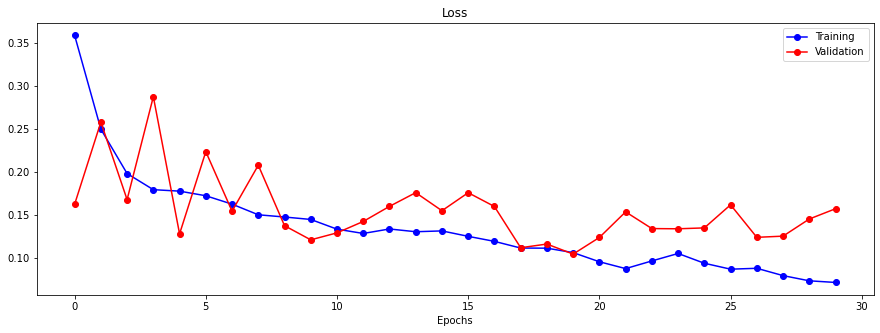

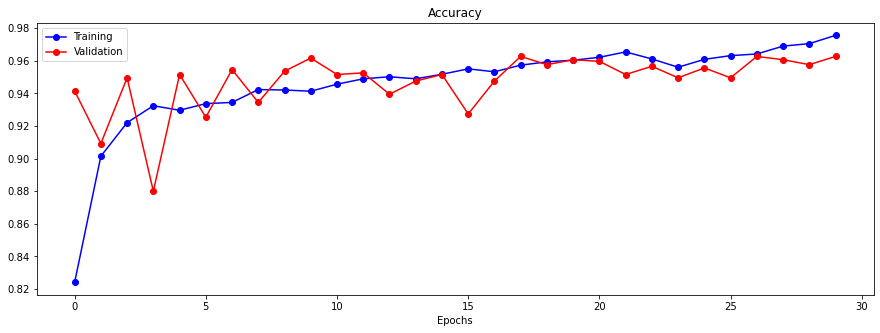

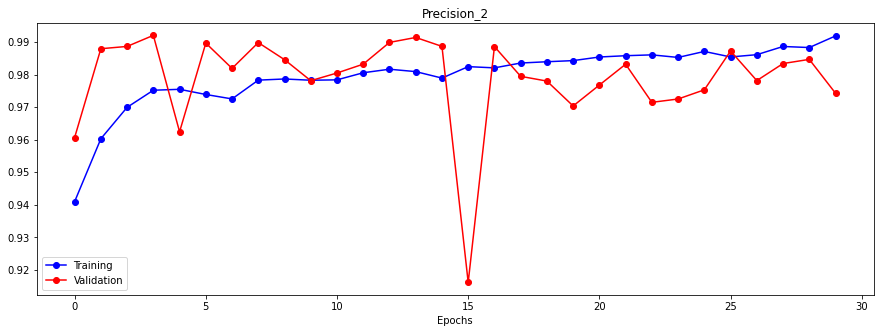

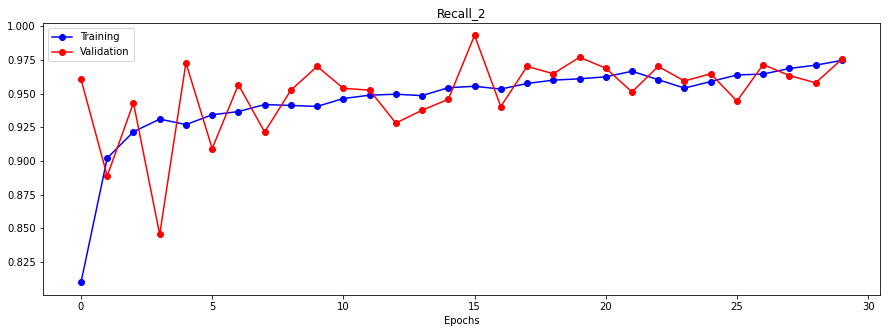

In [190]:
visualize_training_results(results_3)

In [191]:
aug_train_eval_generator = aug.flow_from_dataframe(
    dataframe=train_df, x_col='image', y_col='label',
    class_mode='raw',
    color_mode='grayscale',
    target_size=(180,180),
    batch_size=BATCH_SIZE,
    seed=2021,
    shuffle=False     # not shuffle so that the predicts come out in the same order as in the original dataset
)

val_eval_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=val_df, x_col='image', y_col='label',
    class_mode='raw',
    color_mode='grayscale',
    target_size=(180,180), batch_size=BATCH_SIZE,
    seed=2021,
    shuffle=False
)

preds_train_3 = cnn_3.predict(aug_train_eval_generator,
                              steps=(aug_train_eval_generator.n//BATCH_SIZE+1),
                              verbose=1,
                              workers=8)
preds_val_3 = cnn_3.predict(val_eval_generator,
                            steps=(val_eval_generator.n//BATCH_SIZE+1),
                            verbose=1,
                            workers=8)



Found 3971 validated image filenames.
Found 993 validated image filenames.
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in dev

2024-03-03 03:11:52.553321: I tensorflow/core/common_runtime/placer.cc:114] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:11:52.553377: I tensorflow/core/common_runtime/placer.cc:114] FlatMapDataset: (FlatMapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:11:52.553390: I tensorflow/core/common_runtime/placer.cc:114] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:11:52.579434: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:11:52.579478: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:11:52.579490: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:11:52.579499: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0

  1/125 [..............................] - ETA: 57sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_52442 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_52442 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_52442 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0


2024-03-03 03:12:04.339559: I tensorflow/core/common_runtime/placer.cc:114] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:12:04.339601: I tensorflow/core/common_runtime/placer.cc:114] FlatMapDataset: (FlatMapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:12:04.339613: I tensorflow/core/common_runtime/placer.cc:114] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:12:04.367691: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:12:04.367727: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:12:04.367739: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:12:04.367749: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0

 1/32 [..............................] - ETA: 12sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_52442 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_52442 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_52442 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Ex

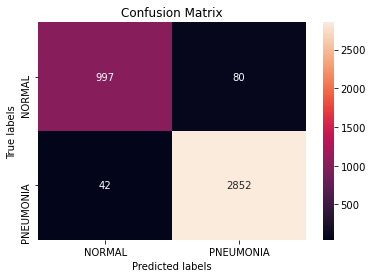

In [192]:
plot_confusionmatrix(train_df['label'], np.rint(preds_train_3))

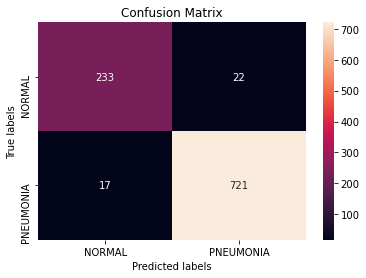

In [193]:
plot_confusionmatrix(val_df['label'], np.rint(preds_val_3))

In [194]:
val_df['cnn_3_pred'] = preds_val_3
val_df.head()

,image,label,type,cnn_3_pred
5768,/home/agaonkar/private/chest_xray/test/PNEUMON...,1,normal,0.955734
2985,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,1.000000
2671,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.999647
5029,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.994028
2432,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.998774


In [195]:
fn3 = val_df[(val_df.label - np.rint(val_df.cnn_3_pred)) == 1]
fn3

,image,label,type,cnn_3_pred
4222,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.064284
4554,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.077487
3179,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.195696
3999,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.129215
3239,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.465830
5705,/home/agaonkar/private/chest_xray/test/PNEUMON...,1,normal,0.076323
1790,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.034236
3493,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.261234
2470,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.296944
3213,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.228811


In [196]:

cnn_3.save("cnn_3_gpu.h5")

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

In [197]:
BATCH_SIZE = 32

test_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=test_df, x_col='image', y_col='label',
    class_mode='raw',
    color_mode='grayscale',
    target_size=(180,180), batch_size=BATCH_SIZE,
    seed=2021,
    shuffle=False
)

Found 876 validated image filenames.


In [198]:
preds_test_3 = cnn_3.predict(test_generator,
                            steps=(test_generator.n//BATCH_SIZE+1),
                            verbose=1,
                            workers=8)

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableO

2024-03-03 03:12:11.848702: I tensorflow/core/common_runtime/placer.cc:114] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:12:11.848751: I tensorflow/core/common_runtime/placer.cc:114] FlatMapDataset: (FlatMapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:12:11.848762: I tensorflow/core/common_runtime/placer.cc:114] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:12:11.879444: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:12:11.879493: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:12:11.879504: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:12:11.879514: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0

 1/28 [>.............................] - ETA: 9sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_52442 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_52442 in device /job:localhost/replica:0/task:0/device:GPU:0
 3/28 [==>...........................] - ETA: 0sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_52442 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device 

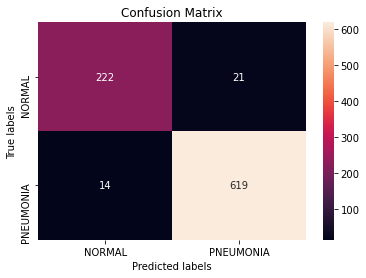

In [199]:
plot_confusionmatrix(test_df['label'], np.rint(preds_test_3)) 

In [200]:
cnn_3.evaluate(test_generator)

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identi

2024-03-03 03:12:33.922178: I tensorflow/core/common_runtime/placer.cc:114] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:12:33.922231: I tensorflow/core/common_runtime/placer.cc:114] FlatMapDataset: (FlatMapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:12:33.922243: I tensorflow/core/common_runtime/placer.cc:114] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:12:33.949670: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:12:33.949711: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:12:33.949724: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:12:33.949735: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0

 1/28 [>.............................] - ETA: 8s - loss: 0.0158 - accuracy: 1.0000 - recall_2: 1.0000 - precision_2: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
 2/28 [=>............................] - ETA: 6s - loss: 0.1653 - accuracy: 0.9375 - recall_2: 0.9787 - precision_2: 0.9388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
 3/28 [==>...........................] - ETA: 5s - loss: 0.1288 - accuracy: 0.9479 - recall_2: 0.9863 - precision_2: 0.9474Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in dev

[0.09998811781406403,
 0.9600456357002258,
 0.9778831005096436,
 0.9671875238418579]

In [201]:
# CALCULATE cnn_4's PERFORMANCE METRICS ON VALIDATION SET
cnn_3_metrics = cnn_3.evaluate(test_generator)
# CREATE A DATAFRAME TO KEEP TRACK OF ALL MODELS PERFOMANCE ON VALIDATION SET
perf_df.loc[len(perf_df.index)] = ['CNN_augmented'] + cnn_3_metrics
perf_df

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identi

2024-03-03 03:12:40.590517: I tensorflow/core/common_runtime/placer.cc:114] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:12:40.590569: I tensorflow/core/common_runtime/placer.cc:114] FlatMapDataset: (FlatMapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:12:40.590581: I tensorflow/core/common_runtime/placer.cc:114] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:12:40.618234: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:12:40.618276: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:12:40.618288: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:12:40.618298: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0

 1/28 [>.............................] - ETA: 8s - loss: 0.0158 - accuracy: 1.0000 - recall_2: 1.0000 - precision_2: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
 2/28 [=>............................] - ETA: 5s - loss: 0.1653 - accuracy: 0.9375 - recall_2: 0.9787 - precision_2: 0.9388Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_22393 in device /job:localhost/replica:0/task:0/device:GPU:0
 3/28 [==>...........................] - ETA: 5s - loss: 0.1288 - accuracy: 0.9479 - recall_2: 0.9863 - precision_2: 0.9474Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in dev

,model,loss,accuracy,recall,precision
0,CNN,0.125514,0.954338,0.946288,0.990083
1,CNN_augmented,0.099988,0.960046,0.977883,0.967188
2,CNN_augmented,0.099988,0.960046,0.977883,0.967188


In [202]:


# Compute confusion matrix
cm = confusion_matrix(test_df['label'], np.rint(preds_test_3))
TP = cm[1, 1]
TN = cm[0, 0]
FP = cm[0, 1]
FN = cm[1, 0]

# Calculate metrics
accuracy = (TP + TN) / (TP + TN + FP + FN)
precision = TP / (TP + FP)
recall = TP / (TP + FN)
f1_score = TP / (TP + 0.5 * (FP + FN))

# Matthews correlation coefficient (MCC)
mcc_numerator = TN * TP - FN * FP
mcc_denominator = sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN))
mcc_score = mcc_numerator / mcc_denominator if mcc_denominator != 0 else 0

# Cohen's Kappa score
kappa_numerator = 2 * (TP * TN - FN * FP)
kappa_denominator = (TP + FP) * (FP + TN) + (TP + FN) * (FN + TN)
kappa_score = kappa_numerator / kappa_denominator if kappa_denominator != 0 else 0

# Print metrics
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1_score:.4f}")
print(f"MCC Score: {mcc_score:.4f}")
print(f"Kappa Score: {kappa_score:.4f}")


Accuracy: 0.9600
Precision: 0.9672
Recall: 0.9779
F1 Score: 0.9725
MCC Score: 0.8996
Kappa Score: 0.8994


### Model 2: Transfer Learning with ResNet50

In [230]:
BATCH_SIZE = 32
IMG_SIZE = (224, 224)
INPUT_SHAPE = (224, 224, 3)

# CREATE GENERATOR FOR TRAINING DATA (FROM train_df DATAFRAME)
resnet_train_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=train_df, x_col='image', y_col='label',
    color_mode='rgb',    # 3 channels instead of grayscale (1 channel) as before
    class_mode='raw',
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    seed=42,
    shuffle=True   # shuffle so we're not missing out on any samples
)

# CREATE GENERATOR FOR VALIDATION DATA (FROM val_df DATAFRAME)
resnet_val_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=val_df, x_col='image', y_col='label',
    color_mode='rgb',    # 3 channels
    class_mode='raw',
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    seed=42,
    shuffle=True
)

Found 3971 validated image filenames.
Found 993 validated image filenames.


In [231]:
cnn_7 = Sequential()

# first layer would be NON-TRAINABLE (using pre-trained ResNet weights as is)
base_model = ResNet50(weights='imagenet',
                      include_top=False,
                      pooling='avg')
cnn_7.add(base_model)
cnn_7.add(Dense(1, activation='sigmoid'))

# freeze the weights of base model:
for layer in base_model.layers:
    layer.trainable = False

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomGetKeyCounter in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomUniformV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing o

In [232]:

# Define a learning rate schedule
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.001,
    decay_steps=1000,
    decay_rate=0.96,  # Adjusted decay_rate for a more common usage example
    staircase=True)

# Create an Adam optimizer with the defined schedule
adam = tf.keras.optimizers.Adam(learning_rate=lr_schedule)


Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Cast in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Cast in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RealDiv in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Floor in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Pow in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0


In [233]:
# USING SGD TO CUSTOMIZE LEARNING RATE
recall = Recall()
precision = Precision()
cnn_7.compile(optimizer=adam,
              loss='binary_crossentropy',
              metrics=['accuracy', recall, precision])
cnn_7.summary()

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localh

In [234]:
checkpoint_cb = ModelCheckpoint('cnn_7.h5',
                                save_best_only=True,
                                monitor='val_loss',
                                mode='min')
early_stopping_cb = EarlyStopping(patience=3,
                                  restore_best_weights=True,
                                  monitor='val_loss',
                                  mode='min')

EPOCHS = 5

results_7 = cnn_7.fit(resnet_train_generator, 
                      validation_data=resnet_val_generator,
                      epochs=EPOCHS,
                      class_weight=class_weight,
                      steps_per_epoch=(resnet_train_generator.n//BATCH_SIZE),
                      validation_steps=(resnet_val_generator.n//BATCH_SIZE),
                      callbacks=[checkpoint_cb, early_stopping_cb,TimingCallback])

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp 

2024-03-03 03:20:46.018944: I tensorflow/core/common_runtime/placer.cc:114] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:20:46.018995: I tensorflow/core/common_runtime/placer.cc:114] FlatMapDataset: (FlatMapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:20:46.019006: I tensorflow/core/common_runtime/placer.cc:114] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:20:46.036629: I tensorflow/core/common_runtime/placer.cc:114] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:20:46.036657: I tensorflow/core/common_runtime/placer.cc:114] other__arguments_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:20:46.036671: I tensorflow/core/common_runtime/placer.cc:114] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:20:46.036682: I tensorflow/core/common_runtime/placer.cc:114] handle_RetVal: (_Retval): /job:local

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localh

2024-03-03 03:20:49.703811: I tensorflow/core/common_runtime/placer.cc:114] iterator: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:20:49.703859: I tensorflow/core/common_runtime/placer.cc:114] sequential_9_resnet50_conv1_conv_conv2d_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 03:20:49.703885: I tensorflow/core/common_runtime/placer.cc:114] sequential_9_resnet50_conv1_conv_biasadd_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 03:20:49.703894: I tensorflow/core/common_runtime/placer.cc:114] sequential_9_resnet50_conv1_bn_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 03:20:49.703903: I tensorflow/core/common_runtime/placer.cc:114] sequential_9_resnet50_conv1_bn_readvariableop_1_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 03:20:49.703911: I tensorflow/core/common_runtime/placer.cc:114] sequential_9_resnet50_co

ost/replica:0/task:0/device:CPU:0
identity_2_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
GatherV2/axis: (Const): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
args_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
gatherv2_params: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
GatherV2: (GatherV2): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
Identity_1: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
Identity_2: (Ide

2024-03-03 03:20:50.343716: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:20:50.343782: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:20:50.343796: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:20:50.343808: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:20:50.343819: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:20:50.343831: I tensorflow/core/common_runtime/placer.cc:114] PyFunc: (PyFunc): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:20:50.349522: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:20

  1/124 [..............................] - ETA: 11:21 - loss: 1.2617 - accuracy: 0.2812 - recall_4: 0.0000e+00 - precision_4: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_123692 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 7s - loss: 1.2832 - accuracy: 0.2344 - recall_4: 0.0000e+00 - precision_4: 0.0000e+00   Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_123692 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 7s - loss: 1.1836 - accuracy: 0.2812 - recall_4: 0.0000e+00 - precision_4: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/d

2024-03-03 03:21:24.738436: I tensorflow/core/common_runtime/placer.cc:114] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:21:24.738481: I tensorflow/core/common_runtime/placer.cc:114] FlatMapDataset: (FlatMapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:21:24.738492: I tensorflow/core/common_runtime/placer.cc:114] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:21:24.775517: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:21:24.775560: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:21:24.775572: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:21:24.775581: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0

:0/task:0/device:GPU:0
Sum_6/reduction_indices: (Const): /job:localhost/replica:0/task:0/device:GPU:0
strided_slice_5/stack: (Const): /job:localhost/replica:0/task:0/device:GPU:0
strided_slice_5/stack_1: (Const): /job:localhost/replica:0/task:0/device:GPU:0
strided_slice_5/stack_2: (Const): /job:localhost/replica:0/task:0/device:GPU:0
strided_slice_6/stack: (Const): /job:localhost/replica:0/task:0/device:GPU:0
strided_slice_6/stack_1: (Const): /job:localhost/replica:0/task:0/device:GPU:0
strided_slice_6/stack_2: (Const): /job:localhost/replica:0/task:0/device:GPU:0
Const_3: (Const): /job:localhost/replica:0/task:0/device:GPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
PyFunc: (PyFunc): /job:localhost/repl

2024-03-03 03:21:26.792132: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:21:26.792185: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:21:26.792197: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:21:26.792207: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:21:26.792219: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:21:26.792229: I tensorflow/core/common_runtime/placer.cc:114] PyFunc: (PyFunc): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:21:26.796237: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:21

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_125843 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_125843 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_125843 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_125843 in device /

2024-03-03 03:21:35.494737: I tensorflow/core/common_runtime/placer.cc:114] resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 03:21:35.494787: I tensorflow/core/common_runtime/placer.cc:114] ReadVariableOp: (ReadVariableOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 03:21:35.494799: I tensorflow/core/common_runtime/placer.cc:114] value_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 03:21:35.504978: I tensorflow/core/common_runtime/placer.cc:114] resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 03:21:35.505008: I tensorflow/core/common_runtime/placer.cc:114] ReadVariableOp: (ReadVariableOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 03:21:35.505020: I tensorflow/core/common_runtime/placer.cc:114] value_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 03:21:35.516947: I tensorflow/core/common_runtime/placer.cc:114] resource: (_Arg): /job:localhost/replica:0/t

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

2024-03-03 03:21:35.784928: I tensorflow/core/common_runtime/placer.cc:114] resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 03:21:35.784970: I tensorflow/core/common_runtime/placer.cc:114] ReadVariableOp: (ReadVariableOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 03:21:35.784981: I tensorflow/core/common_runtime/placer.cc:114] value_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 03:21:35.797372: I tensorflow/core/common_runtime/placer.cc:114] resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 03:21:35.797400: I tensorflow/core/common_runtime/placer.cc:114] ReadVariableOp: (ReadVariableOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 03:21:35.797411: I tensorflow/core/common_runtime/placer.cc:114] value_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 03:21:35.810707: I tensorflow/core/common_runtime/placer.cc:114] resource: (_Arg): /job:localhost/replica:0/t

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

2024-03-03 03:21:36.027734: I tensorflow/core/common_runtime/placer.cc:114] resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 03:21:36.027788: I tensorflow/core/common_runtime/placer.cc:114] ReadVariableOp: (ReadVariableOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 03:21:36.027800: I tensorflow/core/common_runtime/placer.cc:114] value_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 03:21:36.041179: I tensorflow/core/common_runtime/placer.cc:114] resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 03:21:36.041210: I tensorflow/core/common_runtime/placer.cc:114] ReadVariableOp: (ReadVariableOp): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 03:21:36.041221: I tensorflow/core/common_runtime/placer.cc:114] value_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 03:21:36.061784: I tensorflow/core/common_runtime/placer.cc:114] resource: (_Arg): /job:localhost/replica:0/t

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

2024-03-03 03:21:37.774259: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:21:37.774308: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:21:37.774321: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:21:37.774344: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:21:37.774360: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:21:37.774369: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:21:37.782526: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 47s - loss: 0.7214 - accuracy: 0.3438 - recall_4: 0.0000e+00 - precision_4: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_123692 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 26s - loss: 0.6803 - accuracy: 0.2656 - recall_4: 0.0000e+00 - precision_4: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_123692 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 25s - loss: 0.6587 - accuracy: 0.2292 - recall_4: 0.0000e+00 - precision_4: 0.0000e+00Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/devi

2024-03-03 03:22:10.515981: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:22:10.516028: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:22:10.516040: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:22:10.516050: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:22:10.516076: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:22:10.516085: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:22:10.531317: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_125843 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_125843 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_125843 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_125843 in device /

2024-03-03 03:22:20.405837: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:22:20.405895: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:22:20.405907: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:22:20.405917: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:22:20.405926: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:22:20.405935: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:22:20.414058: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 45s - loss: 0.6070 - accuracy: 0.8438 - recall_4: 0.8400 - precision_4: 0.9545Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_123692 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 23s - loss: 0.5500 - accuracy: 0.9062 - recall_4: 0.9245 - precision_4: 0.9608Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_123692 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 28s - loss: 0.6126 - accuracy: 0.8438 - recall_4: 0.9452 - precision_4: 0.8625Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Id

2024-03-03 03:22:53.156999: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:22:53.157047: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:22:53.157060: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:22:53.157069: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:22:53.157090: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:22:53.157099: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:22:53.170405: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_125843 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_125843 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_125843 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_125843 in device /

2024-03-03 03:23:01.397801: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:23:01.397855: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:23:01.397867: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:23:01.397877: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:23:01.397897: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:23:01.397905: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:23:01.405929: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 44s - loss: 0.6942 - accuracy: 0.6875 - recall_4: 0.6000 - precision_4: 0.8571Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_123692 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 31s - loss: 0.6646 - accuracy: 0.7188 - recall_4: 0.6429 - precision_4: 0.9000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_123692 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 34s - loss: 0.6441 - accuracy: 0.7708 - recall_4: 0.6984 - precision_4: 0.9362Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Id

2024-03-03 03:23:33.847061: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:23:33.847111: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:23:33.847124: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:23:33.847133: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:23:33.847156: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:23:33.847164: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:23:33.861817: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_125843 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_125843 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_125843 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_125843 in device /

2024-03-03 03:23:43.919452: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:23:43.919501: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:23:43.919513: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:23:43.919522: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:23:43.919531: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:23:43.919543: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:23:43.927529: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 42s - loss: 0.6412 - accuracy: 0.8125 - recall_4: 0.9545 - precision_4: 0.8077Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_123692 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 33s - loss: 0.6218 - accuracy: 0.7969 - recall_4: 0.9333 - precision_4: 0.8077Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_123692 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 32s - loss: 0.6165 - accuracy: 0.7812 - recall_4: 0.8841 - precision_4: 0.8243Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Id

2024-03-03 03:24:16.473399: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:24:16.473447: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:24:16.473459: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:24:16.473469: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:24:16.473496: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:24:16.473505: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:24:16.486699: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_125843 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_125843 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_125843 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_125843 in device /

In [235]:
# UNFREEZE resnet LAYERS FOR 2ND ROUND OF TRAINING:
for layer in base_model.layers:
    layer.trainable = True

In [236]:
# REDUCING LEARNING RATE TO 0.01 TO AVOID DAMANGING THE PRETRAINED WEIGHTS
# Define a learning rate schedule
lr_schedule = keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.001,
    decay_steps=1000,
    decay_rate=0.01,
    staircase=True)

# Create an Adam optimizer with the defined schedule
adam = tf.keras.optimizers.Adam(learning_rate=lr_schedule)


# RE-COMPILE MODEL AFTER UNFREEZING ALL LAYERS
cnn_7.compile(optimizer=adam,
              loss='binary_crossentropy',
              metrics=['accuracy', recall, precision])

# PRINT OUT MODEL SUMMARY
cnn_7.summary()

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Cast in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Cast in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RealDiv in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Floor in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Pow in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:

In [237]:
checkpoint_cb = ModelCheckpoint('cnn_resnet.h5',
                                save_best_only=True,
                                monitor='val_loss',
                                mode='min')
early_stopping_cb = EarlyStopping(patience=10,
                                  restore_best_weights=True,
                                  monitor='val_loss',
                                  mode='min')

# INCREASING NUMBER OF EPOCHS BACK TO 30
EPOCHS = 30

results_4 = cnn_7.fit(resnet_train_generator,
                      validation_data=resnet_val_generator,
                      epochs=EPOCHS,
                      class_weight=class_weight,
                      steps_per_epoch=(resnet_train_generator.n//BATCH_SIZE),
                      validation_steps=(resnet_val_generator.n//BATCH_SIZE),
                      callbacks=[checkpoint_cb, early_stopping_cb,TimingCallback])

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
task:0/device:CPU:0
FakeSink2: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
identity_1_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
identity_2_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
GatherV2/axis: (Const): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
PyFunc: (PyFunc): /job:localhost/replica:0/task:0/

2024-03-03 03:24:26.632338: I tensorflow/core/common_runtime/placer.cc:114] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:24:26.632398: I tensorflow/core/common_runtime/placer.cc:114] FlatMapDataset: (FlatMapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:24:26.632411: I tensorflow/core/common_runtime/placer.cc:114] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:24:26.650338: I tensorflow/core/common_runtime/placer.cc:114] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:24:26.650364: I tensorflow/core/common_runtime/placer.cc:114] other__arguments_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:24:26.650377: I tensorflow/core/common_runtime/placer.cc:114] MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:24:26.650388: I tensorflow/core/common_runtime/placer.cc:114] handle_RetVal: (_Retval): /job:local

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localh

2024-03-03 03:24:40.943857: I tensorflow/core/common_runtime/placer.cc:114] iterator: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:24:40.943917: I tensorflow/core/common_runtime/placer.cc:114] sequential_9_resnet50_conv1_conv_conv2d_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 03:24:40.943928: I tensorflow/core/common_runtime/placer.cc:114] sequential_9_resnet50_conv1_conv_biasadd_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 03:24:40.943937: I tensorflow/core/common_runtime/placer.cc:114] sequential_9_resnet50_conv1_bn_readvariableop_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 03:24:40.943985: I tensorflow/core/common_runtime/placer.cc:114] sequential_9_resnet50_conv1_bn_readvariableop_1_resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 03:24:40.943993: I tensorflow/core/common_runtime/placer.cc:114] sequential_9_resnet50_co

a:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
other__arguments_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
MapDataset: (MapDataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
args_1: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
gatherv2_params: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
GatherV2: (GatherV

2024-03-03 03:24:44.218284: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:24:44.218358: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:24:44.218371: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:24:44.218381: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:24:44.218390: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:24:44.218400: I tensorflow/core/common_runtime/placer.cc:114] PyFunc: (PyFunc): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:24:44.225350: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:24

  1/124 [..............................] - ETA: 1:33:24 - loss: 7.0462 - accuracy: 0.2500 - recall_4: 0.8515 - precision_4: 0.8780Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 24s - loss: 4.2626 - accuracy: 0.5000 - recall_4: 0.8457 - precision_4: 0.8805    Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 42s - loss: 4.0726 - accuracy: 0.5224 - recall_4: 0.8463 - precision_4: 0.8810Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executi

2024-03-03 03:25:37.094254: I tensorflow/core/common_runtime/placer.cc:114] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:25:37.094316: I tensorflow/core/common_runtime/placer.cc:114] FlatMapDataset: (FlatMapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:25:37.094338: I tensorflow/core/common_runtime/placer.cc:114] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:25:37.129738: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:25:37.129781: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:25:37.129792: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:25:37.129803: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0

ataset): /job:localhost/replica:0/task:0/device:CPU:0
handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
iterator: (_Arg): /job:localhost/replica:0/task:0/dev

2024-03-03 03:25:38.514225: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:25:38.514291: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:25:38.514305: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:25:38.514315: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:25:38.514324: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:25:38.514344: I tensorflow/core/common_runtime/placer.cc:114] PyFunc: (PyFunc): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:25:38.518502: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:25

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /

2024-03-03 03:25:50.466093: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:25:50.466148: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:25:50.466160: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:25:50.466171: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:25:50.466181: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:25:50.466190: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:25:50.474245: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 1:00 - loss: 0.1639 - accuracy: 0.8438 - recall_4: 0.8000 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 29s - loss: 0.0989 - accuracy: 0.9062 - recall_4: 0.8776 - precision_4: 1.0000 Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 29s - loss: 0.1426 - accuracy: 0.8854 - recall_4: 0.8630 - precision_4: 0.9844Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

2024-03-03 03:26:23.947983: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:26:23.948028: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:26:23.948039: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:26:23.948048: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:26:23.948057: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:26:23.948066: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:26:23.963431: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /

2024-03-03 03:26:35.598480: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:26:35.598553: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:26:35.598566: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:26:35.598576: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:26:35.598585: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:26:35.598594: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:26:35.607167: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 1:07 - loss: 0.0548 - accuracy: 1.0000 - recall_4: 1.0000 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 36s - loss: 0.0553 - accuracy: 0.9844 - recall_4: 0.9762 - precision_4: 1.0000 Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 30s - loss: 0.0845 - accuracy: 0.9792 - recall_4: 0.9697 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

2024-03-03 03:27:08.744559: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:27:08.744609: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:27:08.744621: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:27:08.744631: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:27:08.744640: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:27:08.744649: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:27:08.759614: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /

2024-03-03 03:27:20.271695: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:27:20.271749: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:27:20.271762: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:27:20.271772: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:27:20.271783: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:27:20.271793: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:27:20.280658: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 56s - loss: 0.0506 - accuracy: 0.9688 - recall_4: 0.9600 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 32s - loss: 0.0682 - accuracy: 0.9688 - recall_4: 0.9783 - precision_4: 0.9783Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 30s - loss: 0.0532 - accuracy: 0.9792 - recall_4: 0.9861 - precision_4: 0.9861Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Id

2024-03-03 03:27:53.698699: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:27:53.698749: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:27:53.698762: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:27:53.698771: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:27:53.698780: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:27:53.698789: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:27:53.715959: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /

2024-03-03 03:28:05.218368: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:28:05.218425: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:28:05.218438: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:28:05.218455: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:28:05.218465: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:28:05.218474: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:28:05.226770: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 53s - loss: 0.6292 - accuracy: 0.7500 - recall_4: 0.7143 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 32s - loss: 0.3614 - accuracy: 0.8594 - recall_4: 0.8333 - precision_4: 0.9756Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 33s - loss: 0.2566 - accuracy: 0.9062 - recall_4: 0.8857 - precision_4: 0.9841Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Id

2024-03-03 03:28:38.650570: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:28:38.650618: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:28:38.650631: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:28:38.650641: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:28:38.650650: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:28:38.650660: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:28:38.666842: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /

2024-03-03 03:28:50.240128: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:28:50.240199: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:28:50.240212: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:28:50.240225: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:28:50.240234: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:28:50.240243: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:28:50.248771: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 58s - loss: 0.0057 - accuracy: 1.0000 - recall_4: 1.0000 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 36s - loss: 0.0139 - accuracy: 1.0000 - recall_4: 1.0000 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 34s - loss: 0.0593 - accuracy: 0.9896 - recall_4: 1.0000 - precision_4: 0.9851Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Id

2024-03-03 03:29:23.292506: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:29:23.292561: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:29:23.292573: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:29:23.292585: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:29:23.292594: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:29:23.292604: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:29:23.307272: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /

2024-03-03 03:29:35.472029: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:29:35.472087: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:29:35.472099: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:29:35.472110: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:29:35.472119: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:29:35.472128: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:29:35.483910: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 58s - loss: 0.0392 - accuracy: 0.9688 - recall_4: 0.9583 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 30s - loss: 0.0333 - accuracy: 0.9688 - recall_4: 0.9574 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 30s - loss: 0.0234 - accuracy: 0.9792 - recall_4: 0.9718 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Id

2024-03-03 03:30:09.163781: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:30:09.163831: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:30:09.163844: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:30:09.163859: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:30:09.163868: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:30:09.163877: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:30:09.181150: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /

2024-03-03 03:30:20.631588: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:30:20.631643: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:30:20.631656: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:30:20.631666: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:30:20.631675: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:30:20.631684: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:30:20.645952: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 59s - loss: 0.0259 - accuracy: 1.0000 - recall_4: 1.0000 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 25s - loss: 0.0460 - accuracy: 0.9844 - recall_4: 0.9811 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 27s - loss: 0.0491 - accuracy: 0.9792 - recall_4: 0.9740 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Id

2024-03-03 03:30:53.950953: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:30:53.951000: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:30:53.951013: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:30:53.951023: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:30:53.951033: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:30:53.951042: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:30:53.967523: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /

2024-03-03 03:31:05.346551: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:31:05.346606: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:31:05.346618: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:31:05.346628: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:31:05.346638: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:31:05.346647: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:31:05.360059: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 1:02 - loss: 0.0543 - accuracy: 0.9375 - recall_4: 0.9200 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 33s - loss: 0.0655 - accuracy: 0.9375 - recall_4: 0.9167 - precision_4: 1.0000 Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 33s - loss: 0.0770 - accuracy: 0.9375 - recall_4: 0.9167 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

2024-03-03 03:31:38.123171: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:31:38.123225: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:31:38.123236: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:31:38.123246: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:31:38.123255: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:31:38.123264: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:31:38.138799: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /

2024-03-03 03:31:49.591811: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:31:49.591873: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:31:49.591886: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:31:49.591896: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:31:49.591906: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:31:49.591915: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:31:49.600080: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 1:11 - loss: 0.0177 - accuracy: 1.0000 - recall_4: 1.0000 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 32s - loss: 0.0164 - accuracy: 1.0000 - recall_4: 1.0000 - precision_4: 1.0000 Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 30s - loss: 0.0329 - accuracy: 0.9792 - recall_4: 0.9714 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

2024-03-03 03:32:22.123630: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:32:22.123676: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:32:22.123688: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:32:22.123698: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:32:22.123720: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:32:22.123729: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:32:22.137935: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /

2024-03-03 03:32:33.428761: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:32:33.428819: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:32:33.428831: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:32:33.428842: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:32:33.428851: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:32:33.428860: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:32:33.437171: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 57s - loss: 0.0374 - accuracy: 0.9688 - recall_4: 0.9600 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 27s - loss: 0.0916 - accuracy: 0.9688 - recall_4: 0.9792 - precision_4: 0.9792Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 34s - loss: 0.1447 - accuracy: 0.9479 - recall_4: 0.9841 - precision_4: 0.9394Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Id

2024-03-03 03:33:06.216809: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:33:06.216863: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:33:06.216875: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:33:06.216887: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:33:06.216896: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:33:06.216907: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:33:06.230901: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /

2024-03-03 03:33:17.386303: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:33:17.386363: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:33:17.386376: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:33:17.386386: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:33:17.386395: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:33:17.386404: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:33:17.394376: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 58s - loss: 0.0267 - accuracy: 0.9688 - recall_4: 0.9565 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 30s - loss: 0.0159 - accuracy: 0.9844 - recall_4: 0.9796 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 32s - loss: 0.0210 - accuracy: 0.9896 - recall_4: 0.9855 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Id

2024-03-03 03:33:50.291007: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:33:50.291060: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:33:50.291073: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:33:50.291083: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:33:50.291093: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:33:50.291102: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:33:50.304850: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /

2024-03-03 03:34:01.984062: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:34:01.984112: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:34:01.984125: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:34:01.984135: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:34:01.984144: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:34:01.984154: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:34:01.992169: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 54s - loss: 0.0096 - accuracy: 1.0000 - recall_4: 1.0000 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 35s - loss: 0.0516 - accuracy: 0.9844 - recall_4: 1.0000 - precision_4: 0.9796Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 36s - loss: 0.0523 - accuracy: 0.9896 - recall_4: 1.0000 - precision_4: 0.9855Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Id

2024-03-03 03:34:35.074118: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:34:35.074168: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:34:35.074181: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:34:35.074191: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:34:35.074205: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:34:35.074214: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:34:35.089363: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /

2024-03-03 03:34:46.654413: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:34:46.654465: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:34:46.654478: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:34:46.654488: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:34:46.654498: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:34:46.654508: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:34:46.663554: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 1:02 - loss: 0.0632 - accuracy: 0.9688 - recall_4: 1.0000 - precision_4: 0.9545Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 32s - loss: 0.0391 - accuracy: 0.9844 - recall_4: 1.0000 - precision_4: 0.9762 Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 31s - loss: 0.0338 - accuracy: 0.9896 - recall_4: 1.0000 - precision_4: 0.9844Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

2024-03-03 03:35:19.793388: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:35:19.793441: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:35:19.793453: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:35:19.793464: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:35:19.793474: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:35:19.793483: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:35:19.808774: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /

2024-03-03 03:35:31.283418: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:35:31.283473: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:35:31.283485: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:35:31.283496: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:35:31.283505: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:35:31.283515: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:35:31.292181: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 55s - loss: 0.0058 - accuracy: 1.0000 - recall_4: 1.0000 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 24s - loss: 0.0355 - accuracy: 0.9531 - recall_4: 0.9412 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 27s - loss: 0.0472 - accuracy: 0.9583 - recall_4: 0.9474 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Id

2024-03-03 03:36:04.958981: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:36:04.959032: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:36:04.959045: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:36:04.959056: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:36:04.959066: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:36:04.959075: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:36:04.973549: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /

2024-03-03 03:36:16.501230: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:36:16.501303: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:36:16.501316: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:36:16.501335: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:36:16.501346: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:36:16.501355: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:36:16.509528: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 1:06 - loss: 0.0112 - accuracy: 1.0000 - recall_4: 1.0000 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 32s - loss: 0.0099 - accuracy: 1.0000 - recall_4: 1.0000 - precision_4: 1.0000 Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 32s - loss: 0.0383 - accuracy: 0.9896 - recall_4: 1.0000 - precision_4: 0.9851Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

2024-03-03 03:36:50.008894: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:36:50.008945: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:36:50.008957: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:36:50.008977: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:36:50.008987: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:36:50.008996: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:36:50.025594: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /

2024-03-03 03:37:01.407457: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:37:01.407508: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:37:01.407520: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:37:01.407531: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:37:01.407541: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:37:01.407550: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:37:01.415785: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 49s - loss: 0.0681 - accuracy: 0.9688 - recall_4: 0.9667 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 39s - loss: 0.0355 - accuracy: 0.9844 - recall_4: 0.9804 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 35s - loss: 0.0294 - accuracy: 0.9896 - recall_4: 0.9865 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Id

2024-03-03 03:37:34.117002: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:37:34.117056: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:37:34.117070: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:37:34.117079: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:37:34.117088: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:37:34.117097: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:37:34.131178: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /

2024-03-03 03:37:42.461064: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:37:42.461120: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:37:42.461132: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:37:42.461148: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:37:42.461157: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:37:42.461165: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:37:42.471829: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 1:02 - loss: 0.0491 - accuracy: 0.9688 - recall_4: 0.9615 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 30s - loss: 0.0263 - accuracy: 0.9844 - recall_4: 0.9796 - precision_4: 1.0000 Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 26s - loss: 0.0212 - accuracy: 0.9896 - recall_4: 0.9872 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

2024-03-03 03:38:16.033908: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:38:16.033960: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:38:16.033973: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:38:16.033982: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:38:16.034105: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:38:16.034143: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:38:16.049212: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /

2024-03-03 03:38:24.260609: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:38:24.260663: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:38:24.260676: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:38:24.260689: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:38:24.260698: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:38:24.260715: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:38:24.268937: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 58s - loss: 0.0035 - accuracy: 1.0000 - recall_4: 1.0000 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 32s - loss: 0.0055 - accuracy: 1.0000 - recall_4: 1.0000 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 30s - loss: 0.0062 - accuracy: 1.0000 - recall_4: 1.0000 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Id

2024-03-03 03:38:57.835817: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:38:57.835869: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:38:57.835882: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:38:57.835892: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:38:57.835901: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:38:57.835911: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:38:57.850678: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /

2024-03-03 03:39:06.129769: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:39:06.129826: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:39:06.129838: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:39:06.129853: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:39:06.129862: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:39:06.129871: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:39:06.139106: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 54s - loss: 0.0072 - accuracy: 1.0000 - recall_4: 1.0000 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 25s - loss: 0.0429 - accuracy: 0.9688 - recall_4: 0.9630 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 28s - loss: 0.0422 - accuracy: 0.9792 - recall_4: 0.9730 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Id

2024-03-03 03:39:39.359234: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:39:39.359284: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:39:39.359298: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:39:39.359308: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:39:39.359317: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:39:39.359335: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:39:39.373976: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /

2024-03-03 03:39:47.675859: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:39:47.675910: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:39:47.675923: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:39:47.675938: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:39:47.675946: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:39:47.675955: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:39:47.684043: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 1:02 - loss: 0.0450 - accuracy: 1.0000 - recall_4: 1.0000 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 30s - loss: 0.0253 - accuracy: 1.0000 - recall_4: 1.0000 - precision_4: 1.0000 Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 31s - loss: 0.0221 - accuracy: 1.0000 - recall_4: 1.0000 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

2024-03-03 03:40:20.916201: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:40:20.916254: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:40:20.916268: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:40:20.916284: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:40:20.916293: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:40:20.916302: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:40:20.930908: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /

2024-03-03 03:40:29.088252: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:40:29.088309: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:40:29.088322: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:40:29.088345: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:40:29.088355: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:40:29.088366: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:40:29.097460: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 1:07 - loss: 0.0735 - accuracy: 0.9688 - recall_4: 1.0000 - precision_4: 0.9545Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 37s - loss: 0.0538 - accuracy: 0.9688 - recall_4: 0.9762 - precision_4: 0.9762 Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 32s - loss: 0.0388 - accuracy: 0.9792 - recall_4: 0.9851 - precision_4: 0.9851Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

2024-03-03 03:41:02.360770: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:41:02.360823: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:41:02.360837: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:41:02.360846: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:41:02.360856: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:41:02.360866: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:41:02.375260: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /

2024-03-03 03:41:10.686711: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:41:10.686782: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:41:10.686933: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:41:10.686978: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:41:10.686990: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:41:10.687001: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:41:10.697480: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 52s - loss: 0.0064 - accuracy: 1.0000 - recall_4: 1.0000 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 34s - loss: 0.0256 - accuracy: 1.0000 - recall_4: 1.0000 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 31s - loss: 0.0211 - accuracy: 1.0000 - recall_4: 1.0000 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Id

2024-03-03 03:41:43.605106: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:41:43.605155: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:41:43.605169: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:41:43.605179: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:41:43.605212: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:41:43.605222: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:41:43.621174: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /

2024-03-03 03:41:51.879633: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:41:51.879693: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:41:51.879705: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:41:51.879715: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:41:51.879724: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:41:51.879735: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:41:51.889210: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 58s - loss: 0.0378 - accuracy: 1.0000 - recall_4: 1.0000 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 31s - loss: 0.0228 - accuracy: 1.0000 - recall_4: 1.0000 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 29s - loss: 0.0187 - accuracy: 1.0000 - recall_4: 1.0000 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Id

2024-03-03 03:42:25.080703: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:42:25.080754: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:42:25.080768: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:42:25.080777: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:42:25.080786: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:42:25.080795: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:42:25.096234: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /

2024-03-03 03:42:33.408154: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:42:33.408209: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:42:33.408221: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:42:33.408235: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:42:33.408243: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:42:33.408252: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:42:33.416590: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 57s - loss: 0.0747 - accuracy: 0.9688 - recall_4: 1.0000 - precision_4: 0.9545Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 32s - loss: 0.0415 - accuracy: 0.9844 - recall_4: 1.0000 - precision_4: 0.9778Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 28s - loss: 0.0855 - accuracy: 0.9583 - recall_4: 0.9595 - precision_4: 0.9861Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Id

2024-03-03 03:43:06.761798: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:43:06.761850: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:43:06.761863: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:43:06.761873: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:43:06.761882: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:43:06.761891: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:43:06.779638: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /

2024-03-03 03:43:14.962239: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:43:14.962291: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:43:14.962304: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:43:14.962320: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:43:14.962336: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:43:14.962345: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:43:14.971345: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

  1/124 [..............................] - ETA: 55s - loss: 0.0346 - accuracy: 1.0000 - recall_4: 1.0000 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/124 [..............................] - ETA: 39s - loss: 0.0188 - accuracy: 1.0000 - recall_4: 1.0000 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_156075 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/124 [..............................] - ETA: 32s - loss: 0.0138 - accuracy: 1.0000 - recall_4: 1.0000 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Id

2024-03-03 03:43:47.885767: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:43:47.885816: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:43:47.885830: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:43:47.885839: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:43:47.885848: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:43:47.885857: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:43:47.899604: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /

2024-03-03 03:43:57.000861: I tensorflow/core/common_runtime/placer.cc:114] resource: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 03:43:57.000915: I tensorflow/core/common_runtime/placer.cc:114] value: (_Arg): /job:localhost/replica:0/task:0/device:GPU:0
2024-03-03 03:43:57.000931: I tensorflow/core/common_runtime/placer.cc:114] AssignVariableOp: (AssignVariableOp): /job:localhost/replica:0/task:0/device:GPU:0


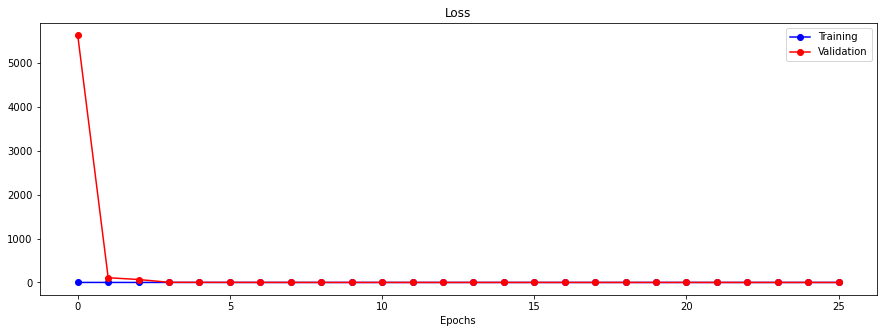

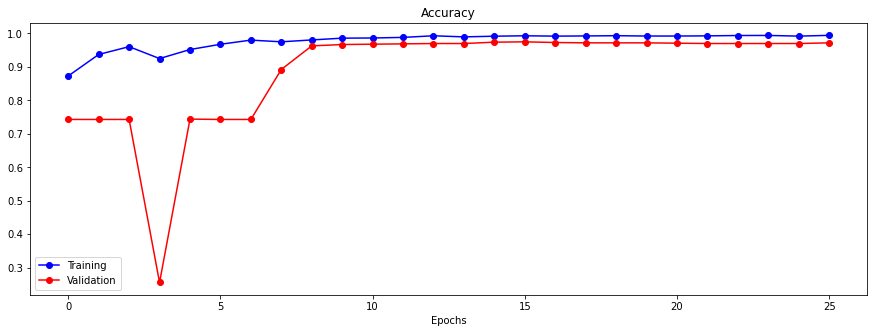

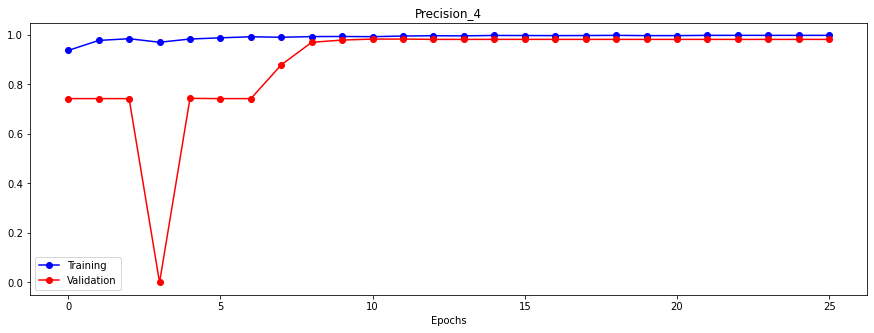

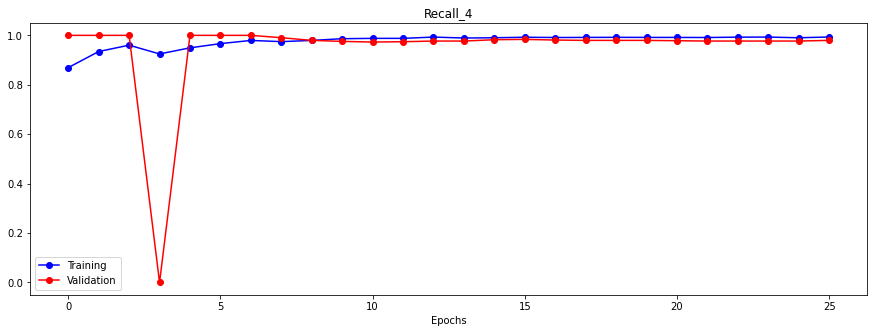

In [239]:
# VISUALIZE MODEL PERFORMANCE
def visualize_training_results(results):
    history = results.history
    
    for m in ['loss', 'accuracy', 'precision_4', 'recall_4']:
        plt.figure(figsize=(15,5))
        plt.plot(history[m], label='Training', marker='o', color='blue')
        plt.plot(history[f'val_{m}'], label='Validation', marker='o', color='red')
        plt.xlabel('Epochs')
        plt.legend()
        plt.title(m.title())
    
    plt.show();
visualize_training_results(results_4)

In [240]:
print(TimingCallback.logs)
print(sum(TimingCallback.logs))

[48.59359098901041, 44.18573175097117, 43.572127305029426, 44.04966662602965, 43.349104918015655, 43.204543659987394, 44.054794711002614, 43.5709038740024, 43.83733728999505, 43.85238182399189, 44.047924595011864, 43.296044576971326, 43.4095149320201, 43.92169828701299, 43.42474534199573, 43.58864077698672, 43.9084954209975, 44.11315424198983, 43.77460970397806, 44.12721919402247, 43.94554364599753, 43.53291127702687, 43.15567382302834, 43.304316419991665, 43.428012035030406, 43.72122547100298, 43.33345323102549, 43.45171807898441, 43.75796410400653, 43.46329984802287, 51.65535616996931, 42.584532736975234, 40.9469582940219, 42.478299891983625, 42.295424982963596, 83.73266253300244, 45.07602456602035, 44.61869763402501, 44.89367417001631, 44.96919037098996, 45.18304244999308, 45.1058182590059, 44.65739907399984, 44.18586545798462, 43.79320621403167, 43.90786417602794, 44.54998017800972, 44.61477342899889, 44.58261089900043, 45.16745048499433, 44.847194561036304, 40.99389912199695, 41.7

It's actually very interesting to see how the model appeared to be "stuck" at a local optima(?) the first 8 epochs and barely made any progress, and then turned around and increased accuracy by almost 20% from epoch 8 to epoch 9.

In [241]:
# CREATE GENERATOR FOR TRAINING DATA (FROM train_df DATAFRAME)
resnet_train_eval_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=train_df, x_col='image', y_col='label',
    color_mode='rgb',    # 3 channels
    class_mode='raw',
    target_size=IMG_SIZE, 
    batch_size=BATCH_SIZE,
    seed=42,
    shuffle=False   # shuffle so we're not missing out on any samples
)

# CREATE GENERATOR FOR VALIDATION DATA (FROM val_df DATAFRAME)
resnet_val_eval_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=val_df, x_col='image', y_col='label',
    color_mode='rgb',    # 3 channels   
    class_mode='raw',
    target_size=IMG_SIZE, 
    batch_size=BATCH_SIZE,
    seed=42,
    shuffle=False
)

preds_train_7 = cnn_7.predict(resnet_train_eval_generator, 
                                steps=(resnet_train_eval_generator.n//BATCH_SIZE+1), 
                                verbose=1,
                                workers=8)
preds_val_7 = cnn_7.predict(resnet_val_eval_generator, 
                              steps=(resnet_val_eval_generator.n//BATCH_SIZE+1),
                              verbose=1,
                              workers=8)

Found 3971 validated image filenames.
Found 993 validated image filenames.
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in dev

2024-03-03 03:48:46.183305: I tensorflow/core/common_runtime/placer.cc:114] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:48:46.183360: I tensorflow/core/common_runtime/placer.cc:114] FlatMapDataset: (FlatMapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:48:46.183375: I tensorflow/core/common_runtime/placer.cc:114] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:48:46.223345: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:48:46.223410: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:48:46.223421: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:48:46.223431: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0

:0
NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
FakeSink0: (Identity): /job:localhost/replica:0/t

2024-03-03 03:48:47.391243: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:48:47.391293: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:48:47.391305: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:48:47.391317: I tensorflow/core/common_runtime/placer.cc:114] FakeSink0: (Identity): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:48:47.391340: I tensorflow/core/common_runtime/placer.cc:114] identity_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:48:47.391352: I tensorflow/core/common_runtime/placer.cc:114] PyFunc: (PyFunc): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:48:47.395359: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:48

  1/125 [..............................] - ETA: 3:15Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_220047 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/125 [..............................] - ETA: 8s  Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_220047 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/125 [..............................] - ETA: 8sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_220047 in device /job:localhost/replica:0/task:0/device:GPU:0
  4/125 [..............................] - ETA: 8sExec

2024-03-03 03:48:56.512593: I tensorflow/core/common_runtime/placer.cc:114] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:48:56.512643: I tensorflow/core/common_runtime/placer.cc:114] FlatMapDataset: (FlatMapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:48:56.512655: I tensorflow/core/common_runtime/placer.cc:114] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:48:56.545774: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:48:56.545811: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:48:56.545823: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:48:56.545833: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0

 1/32 [..............................] - ETA: 16sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_220047 in device /job:localhost/replica:0/task:0/device:GPU:0
 2/32 [>.............................] - ETA: 1s Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_220047 in device /job:localhost/replica:0/task:0/device:GPU:0
 3/32 [=>............................] - ETA: 1sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_220047 in device /job:localhost/replica:0/task:0/device:GPU:0
 4/32 [==>...........................] - ETA: 1sExecuting op R

In [242]:
cnn_7_metrics = cnn_7.evaluate(resnet_val_eval_generator)

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identi

2024-03-03 03:48:59.828460: I tensorflow/core/common_runtime/placer.cc:114] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:48:59.828515: I tensorflow/core/common_runtime/placer.cc:114] FlatMapDataset: (FlatMapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:48:59.828527: I tensorflow/core/common_runtime/placer.cc:114] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:48:59.862815: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:48:59.862861: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:48:59.862873: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:48:59.862883: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0

 1/32 [..............................] - ETA: 14s - loss: 0.0346 - accuracy: 1.0000 - recall_4: 1.0000 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
 2/32 [>.............................] - ETA: 6s - loss: 0.0380 - accuracy: 0.9844 - recall_4: 0.9800 - precision_4: 1.0000 Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
 3/32 [=>............................] - ETA: 7s - loss: 0.0787 - accuracy: 0.9792 - recall_4: 0.9714 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in

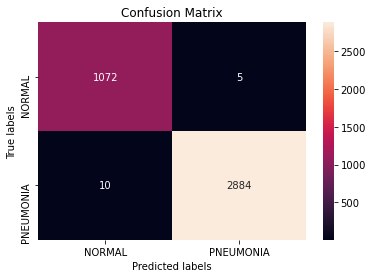

In [243]:
plot_confusionmatrix(train_df['label'], np.rint(preds_train_7))

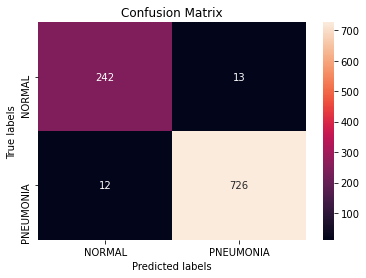

In [244]:
plot_confusionmatrix(val_df['label'], np.rint(preds_val_7))

In [245]:
# APPEND PREDICTIONS OF THE cnn_7 MODEL TO val_df FOR COMPARISON WITH
# OTHER MODELS LATER
val_df['cnn_7_pred'] = preds_val_7

In [246]:
val_df.head()

,image,label,type,cnn_3_pred,cnn_7_pred
5768,/home/agaonkar/private/chest_xray/test/PNEUMON...,1,normal,0.955734,0.531886
2985,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,1.000000,1.000000
2671,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.999647,0.999993
5029,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.994028,0.993251
2432,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.998774,0.999674


In [247]:
# PNEUMONIA CASES THAT HAVE BEEN INCORRECTLY PREDICTED BY cnn_7
fn7 = val_df[(val_df.label - np.rint(val_df.cnn_7_pred)) == 1]
fn7

,image,label,type,cnn_3_pred,cnn_7_pred
4543,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.828203,0.482975
4554,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.077487,0.014736
2113,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.926208,0.366526
3891,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.780985,0.239804
5705,/home/agaonkar/private/chest_xray/test/PNEUMON...,1,normal,0.076323,0.005624
3493,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.261234,0.172327
1650,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.398355,0.249167
2623,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.998004,0.448057
1969,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.989009,0.218773
4802,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.003509,0.006009


In [248]:
# PNEUMONIA CASES THAT HAVE BEEN INCORRECTLY PREDICTED BY 5 MODELS
# baseline, cnn_3, cnn_4, cnn_5, and cnn_7
fn_all = val_df[(np.rint(val_df.cnn_3_pred) == np.rint(val_df.cnn_7_pred))]
fn_all

,image,label,type,cnn_3_pred,cnn_7_pred
5768,/home/agaonkar/private/chest_xray/test/PNEUMON...,1,normal,0.955734,0.531886
2985,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,1.000000,1.000000
2671,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.999647,0.999993
5029,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.994028,0.993251
2432,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.998774,0.999674
...,...,...,...,...,...
4425,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.993567,0.999991
3074,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.999955,0.999980
5819,/home/agaonkar/private/chest_xray/test/PNEUMON...,1,normal,0.983031,0.999201
2390,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.659082,0.927227


In [249]:
# PNEUMONIA CASES THAT HAVE BEEN INCORRECTLY PREDICTED BY MODELS baseline & cnn_2,
# BUT CORRECTLY PREDICTED BY MODEL cnn_3
correct_by_4 = val_df[(val_df.label == 1) & \
                      (np.rint(val_df.cnn_3_pred) == 0) & \
                      (np.rint(val_df.cnn_7_pred) == 1)]
correct_by_4

,image,label,type,cnn_3_pred,cnn_7_pred
4222,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.064284,0.868908
3179,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.195696,0.853273
3999,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.129215,0.940737
3239,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.465830,0.973303
1790,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.034236,0.692004
2470,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.296944,0.686987
3213,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.228811,0.925140
2722,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.148140,0.574599
3270,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.453345,0.969366
1685,/home/agaonkar/private/chest_xray/train/PNEUMO...,1,normal,0.364017,0.844086


In [250]:
img_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=correct_by_4, x_col='image', y_col='cnn_7_pred',
    class_mode='raw',
    color_mode='grayscale',
    target_size=(180,180), batch_size=BATCH_SIZE,
    shuffle=False
)

correct_by_4_img, correct_by_4_prob = next(img_generator)

Found 11 validated image filenames.


In [251]:
# SAVE THE MODEL
cnn_7.save("cnn_7_gpu.h5")

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

In [252]:
# CREATE GENERATOR FOR VALIDATION DATA (FROM test_df DATAFRAME)
resnet_test_generator = ImageDataGenerator(rescale=1.0/255).flow_from_dataframe(
    dataframe=test_df, x_col='image', y_col='label',
    color_mode='rgb',    # 3 channels
    class_mode='raw',
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    seed=42,
    shuffle=False
)

Found 876 validated image filenames.


In [253]:
preds_test_7 = cnn_7.predict(resnet_test_generator,
                             steps=(resnet_test_generator.n//BATCH_SIZE+1),
                             verbose=1,
                             workers=8)

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableO

2024-03-03 03:49:11.643978: I tensorflow/core/common_runtime/placer.cc:114] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:49:11.644027: I tensorflow/core/common_runtime/placer.cc:114] FlatMapDataset: (FlatMapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:49:11.644040: I tensorflow/core/common_runtime/placer.cc:114] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:49:11.678175: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:49:11.678218: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:49:11.678230: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:49:11.678239: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0

 1/28 [>.............................] - ETA: 11sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_220047 in device /job:localhost/replica:0/task:0/device:GPU:0
 2/28 [=>............................] - ETA: 1s Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_220047 in device /job:localhost/replica:0/task:0/device:GPU:0
 3/28 [==>...........................] - ETA: 1sExecuting op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_220047 in device /job:localhost/replica:0/task:0/device:GPU:0
 4/28 [===>..........................] - ETA: 1sExecuting op R

In [254]:
cnn_7_metrics= cnn_7.evaluate(resnet_test_generator)

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identi

2024-03-03 03:49:14.612909: I tensorflow/core/common_runtime/placer.cc:114] input__dataset: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:49:14.612961: I tensorflow/core/common_runtime/placer.cc:114] FlatMapDataset: (FlatMapDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:49:14.612973: I tensorflow/core/common_runtime/placer.cc:114] handle_RetVal: (_Retval): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:49:14.644312: I tensorflow/core/common_runtime/placer.cc:114] args_0: (_Arg): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:49:14.644359: I tensorflow/core/common_runtime/placer.cc:114] GeneratorDataset: (GeneratorDataset): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:49:14.644371: I tensorflow/core/common_runtime/placer.cc:114] NoOp: (NoOp): /job:localhost/replica:0/task:0/device:CPU:0
2024-03-03 03:49:14.644380: I tensorflow/core/common_runtime/placer.cc:114] Identity: (Identity): /job:localhost/replica:0

 1/28 [>.............................] - ETA: 10s - loss: 0.0142 - accuracy: 1.0000 - recall_4: 1.0000 - precision_4: 1.0000Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
 2/28 [=>............................] - ETA: 6s - loss: 0.1012 - accuracy: 0.9531 - recall_4: 0.9574 - precision_4: 0.9783 Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_158226 in device /job:localhost/replica:0/task:0/device:GPU:0
 3/28 [==>...........................] - ETA: 6s - loss: 0.0839 - accuracy: 0.9583 - recall_4: 0.9726 - precision_4: 0.9726Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in

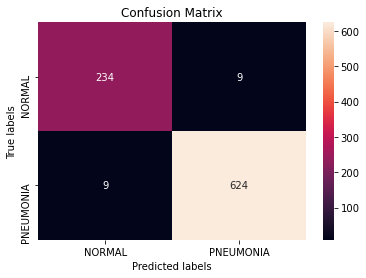

In [256]:
plot_confusionmatrix( test_df['label'], np.rint(preds_test_7))

In [257]:
perf_df.loc[len(perf_df.index)] = ['CNN_Resnet_pretrained'] + cnn_7_metrics
perf_df

,model,loss,accuracy,recall,precision
0,CNN,0.125514,0.954338,0.946288,0.990083
1,CNN_augmented,0.099988,0.960046,0.977883,0.967188
2,CNN_augmented,0.099988,0.960046,0.977883,0.967188
3,CNN_Resnet_pretrained,0.063088,0.979452,0.985782,0.985782


In [258]:

# Compute confusion matrix
cm = confusion_matrix(test_df['label'], np.rint(preds_test_7))
TP = cm[1, 1]
TN = cm[0, 0]
FP = cm[0, 1]
FN = cm[1, 0]

# Calculate metrics
accuracy = (TP + TN) / (TP + TN + FP + FN)
precision = TP / (TP + FP)
recall = TP / (TP + FN)
f1_score = TP / (TP + 0.5 * (FP + FN))

# Matthews correlation coefficient (MCC)
mcc_numerator = TN * TP - FN * FP
mcc_denominator = sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN))
mcc_score = mcc_numerator / mcc_denominator if mcc_denominator != 0 else 0

# Cohen's Kappa score
kappa_numerator = 2 * (TP * TN - FN * FP)
kappa_denominator = (TP + FP) * (FP + TN) + (TP + FN) * (FN + TN)
kappa_score = kappa_numerator / kappa_denominator if kappa_denominator != 0 else 0

# Print metrics
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1_score:.4f}")
print(f"MCC Score: {mcc_score:.4f}")
print(f"Kappa Score: {kappa_score:.4f}")


Accuracy: 0.9795
Precision: 0.9858
Recall: 0.9858
F1 Score: 0.9858
MCC Score: 0.9487
Kappa Score: 0.9487
